# Behavior Comparison for Movie and Shuffled Stimuli

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import scipy.stats as sts
import statsmodels.api as sm
import os

# path settings
PROJECT_PATH = "G:/Shared drives/visual_encoding"
PSD_PATH = f"{PROJECT_PATH}/data/lfp_data/lfp_psd"
SPIKES_IN = f'{PROJECT_PATH}/data/spike_data/synchrony_data'
LFP_IN = f'{PROJECT_PATH}/data/lfp_data/lfp_params'
REPO_PATH = 'C:/Users/micha/visual_encoding' # 'C:/Users/soysa/Documents/Git/visual_encoding'
MANIFEST_PATH = 'E:/datasets/allen_vc' # path to manifest file and local dataset
MATRICES_OUT = f"{PROJECT_PATH}/data/lfp_data/lfp_r_matrices"

# custom imports
import sys
sys.path.append(REPO_PATH)
from allen_vc.sensitivity_analysis import sensitivity_analysis
from allen_vc.plts import running_segment_plot, plot_sa_heat_map, scatter_2_conditions
from allen_vc.utils import combine_spike_lfp_dfs, channel_medians

mpl.rcParams['axes.titlesize'] = 19
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams["font.family"] = "sans-serif"

print("Imported!")

Imported!


# Behavior Distributions

In [2]:
# choose example session of interest
SESSION_ID = 794812542

# load example block
fname_in = f'G:/Shared drives/visual_encoding/data/blocks/{SESSION_ID}_natural_movie.pkl'
block = pd.read_pickle(fname_in)
block

Running segments: 8
Stationary segments: 52
Proportions of time running in run segments: 

[0.5402133333333333, 0.7101066666666667, 0.0268, 0.28229333333333334, 0.19632, 0.35834666666666665, 0.33192, 0.04186666666666667]

Average proportion: 0.3109833333333333




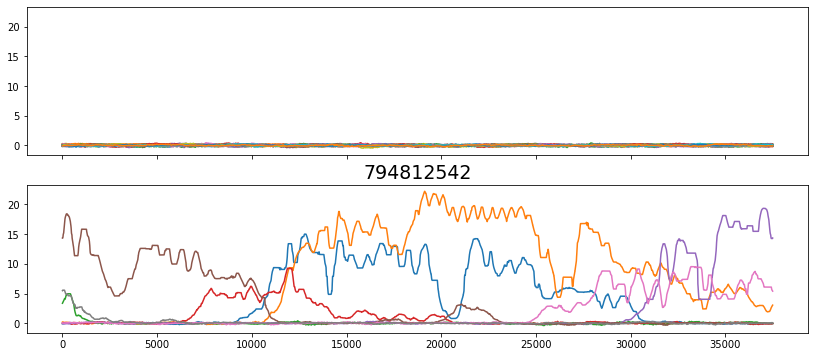

In [3]:
running_segment_plot(block, SESSION_ID);

Analyzing: 787025148_natural_movie.pkl
Running segments: 25
Stationary segments: 35
Proportions of time running in run segments: 

[0.9608266666666667, 1.0, 0.9874133333333334, 0.92136, 0.7935466666666666, 0.12402666666666666, 0.7245333333333334, 0.16970666666666667, 0.9909066666666667, 0.08245333333333334, 0.49389333333333335, 0.44234666666666667, 0.21672, 0.2969333333333333, 0.73512, 0.54552, 0.17645333333333332, 0.06624, 0.06461333333333333, 0.031466666666666664, 0.22970666666666667, 0.6576266666666667, 0.7868, 0.5566133333333333, 0.67952]

Average proportion: 0.5093738666666667


Analyzing: 768515987_natural_movie.pkl
Running segments: 33
Stationary segments: 27
Proportions of time running in run segments: 

[0.12442666666666667, 0.6541333333333333, 0.3672, 0.86456, 0.5517066666666667, 0.4053866666666667, 0.32554666666666665, 0.53424, 0.3334933333333333, 0.41154666666666667, 0.30248, 0.4521866666666667, 0.31690666666666667, 1.0, 0.06176, 0.08725333333333334, 0.62304, 0.209813333333

Running segments: 59
Stationary segments: 1
Proportions of time running in run segments: 

[0.84416, 1.0, 1.0, 0.5541333333333334, 0.12397333333333334, 1.0, 0.78736, 1.0, 0.6998666666666666, 0.33744, 0.12208, 0.05506666666666667, 0.08896, 0.46194666666666667, 0.5539733333333333, 0.54296, 0.68552, 0.7138133333333333, 0.7124, 0.90168, 1.0, 1.0, 0.9253066666666667, 0.5944533333333333, 1.0, 1.0, 1.0, 0.70608, 1.0, 0.8436533333333334, 1.0, 0.9830133333333333, 1.0, 1.0, 0.9436266666666666, 1.0, 0.4620533333333333, 0.6436533333333333, 0.9665866666666667, 0.9605866666666667, 0.8160266666666667, 1.0, 1.0, 0.9012, 0.8263466666666667, 0.1472, 0.7513866666666666, 0.5100533333333334, 0.3764, 0.5508533333333333, 0.5704, 0.4869866666666667, 0.44448, 0.7681333333333333, 0.44624, 0.8518666666666667, 0.6548266666666667, 0.8405333333333334, 0.6344266666666667]

Average proportion: 0.7252831638418081


Analyzing: 831882777_natural_movie.pkl
Running segments: 60
Stationary segments: 0
Proportions of time r

C:/Users/User/visual_encoding\allen_vc\plts.py:245: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(2,1, sharex=True, sharey=True, figsize=(14,6))


Running segments: 12
Stationary segments: 48
Proportions of time running in run segments: 

[0.017573333333333333, 0.13552, 0.02224, 0.18706666666666666, 0.019066666666666666, 0.5599466666666667, 0.07672, 0.06938666666666667, 0.0021866666666666666, 0.041973333333333335, 0.12130666666666666, 0.04128]

Average proportion: 0.10785555555555555


Analyzing: 835479236_natural_movie.pkl
Running segments: 45
Stationary segments: 15
Proportions of time running in run segments: 

[0.6548533333333333, 1.0, 0.9562133333333334, 0.9897333333333334, 0.09058666666666666, 0.11792, 1.0, 1.0, 1.0, 0.024, 0.254, 0.4150933333333333, 0.48589333333333334, 0.08093333333333333, 0.16061333333333333, 0.38749333333333336, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9566933333333333, 1.0, 0.6488, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9902133333333333, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

Average proportion: 0.8269564444444444




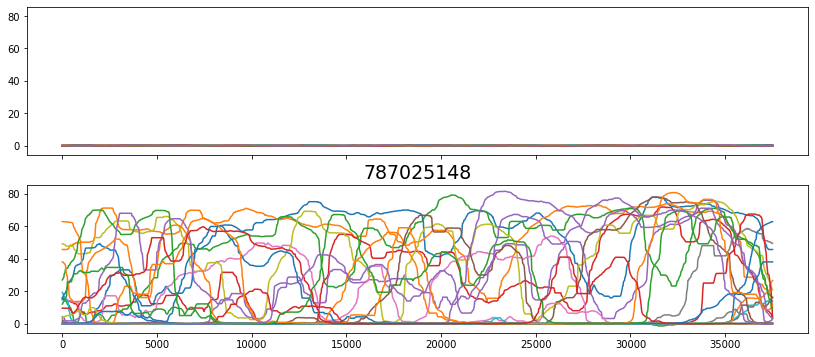

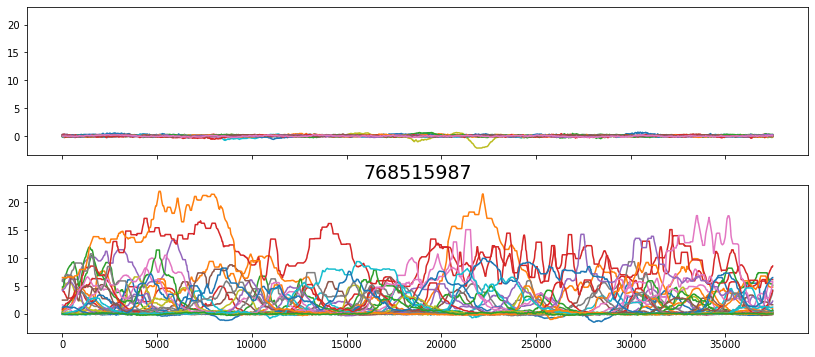

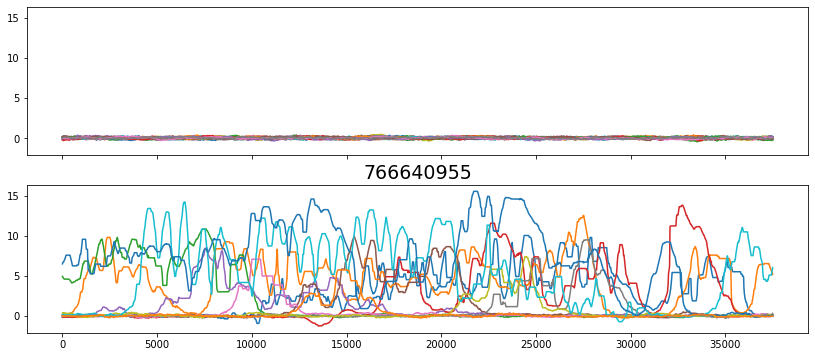

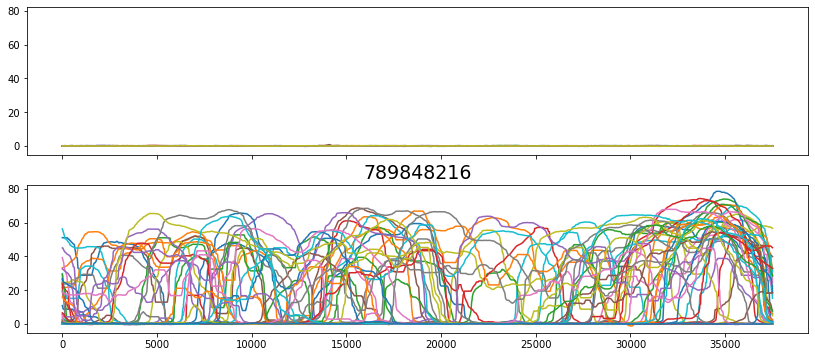

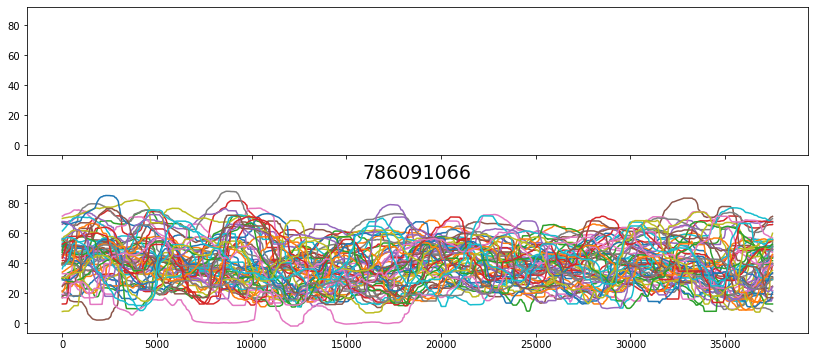

...

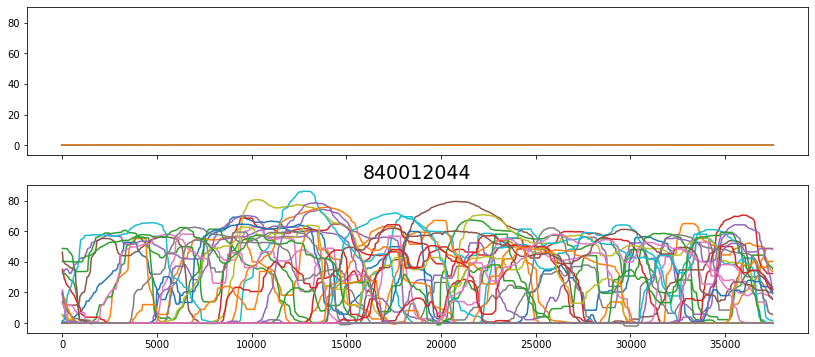

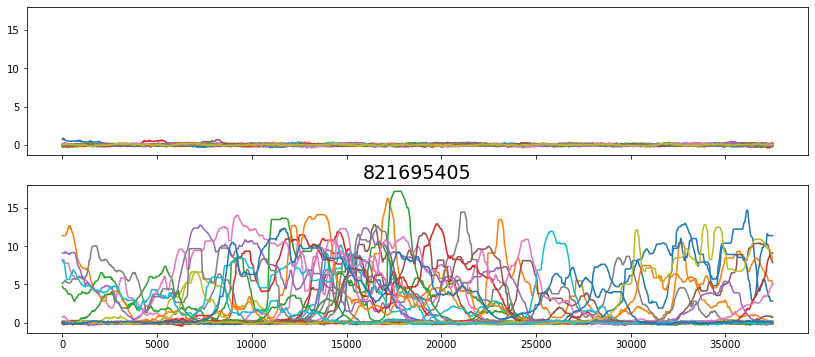

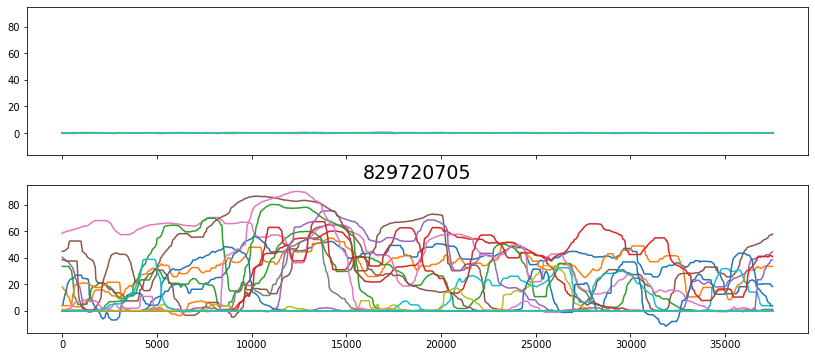

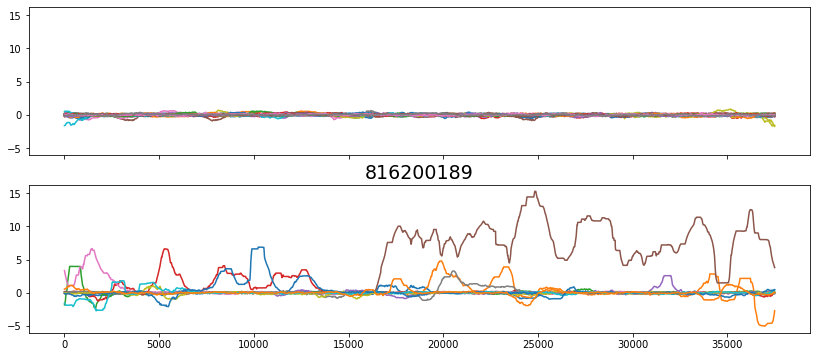

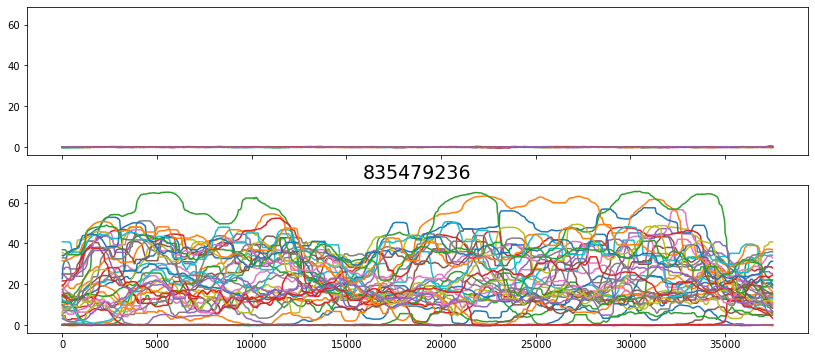

In [4]:
BLOCKS_IN = f"{PROJECT_PATH}/data/blocks"

for file in os.listdir(BLOCKS_IN):
    
    if file[-9:] != "movie.pkl":
        continue
        
    print(f"Analyzing: {file}")
    
    block = pd.read_pickle(BLOCKS_IN + '/' + file)
    
    running_segment_plot(block, file.split("_")[0]);

In [ ]:
# 778998620 fishy

# repeat for shuffled

# Look at LFP/spike metrics split by behavioral state

In [2]:
movie_spikes = pd.read_csv(f'{SPIKES_IN}/VISp-LGd_natural_movie.csv')
movie_lfp = pd.read_csv(f'{LFP_IN}/natural_movie/all_params.csv').drop(columns="Unnamed: 0").drop(columns="Unnamed: 0.1")

In [3]:
shuffled_spikes = pd.read_csv(f'{SPIKES_IN}/VISp-LGd_natural_movie_shuffled.csv')
shuffled_lfp = pd.read_csv(f'{LFP_IN}/natural_movie_shuffled/lfp_params.csv').drop(columns="Unnamed: 0")

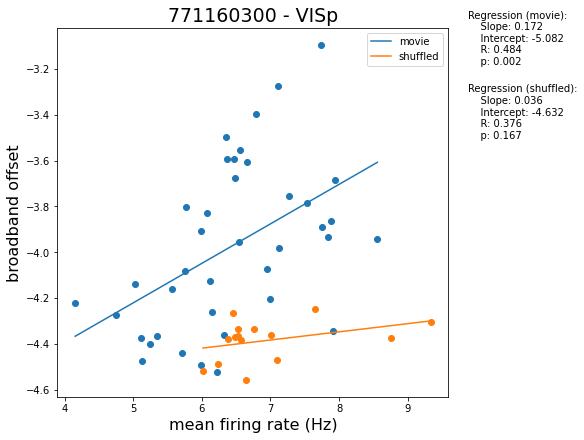

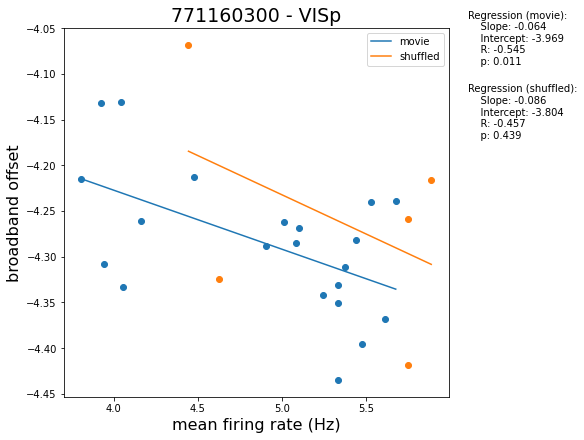

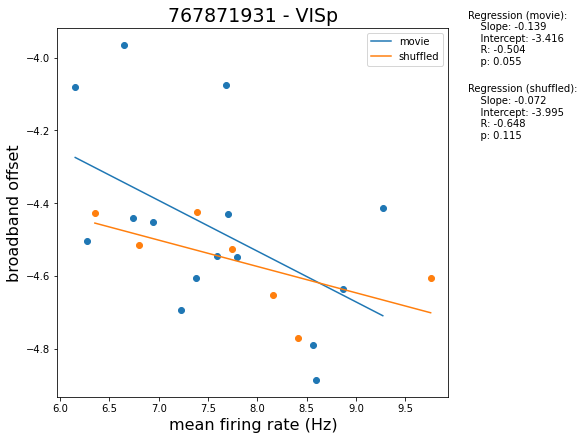

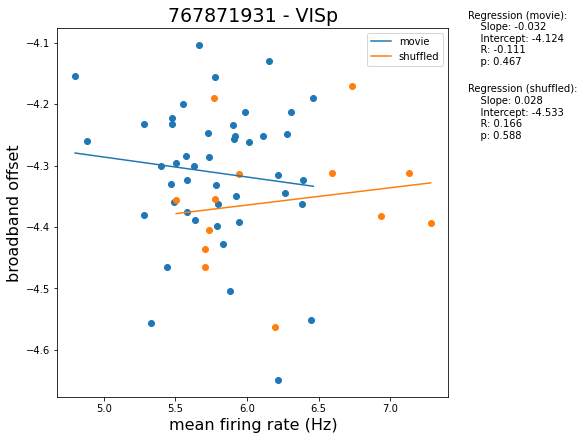

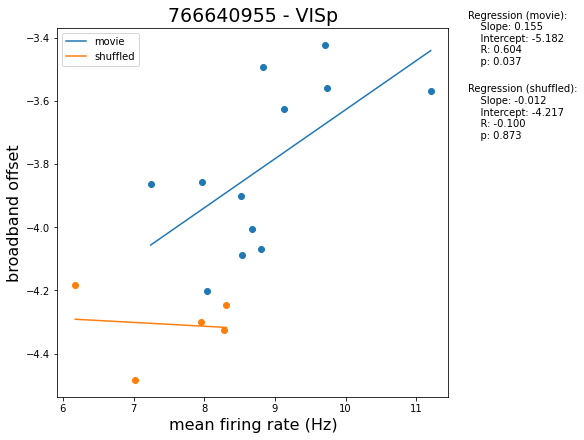

...

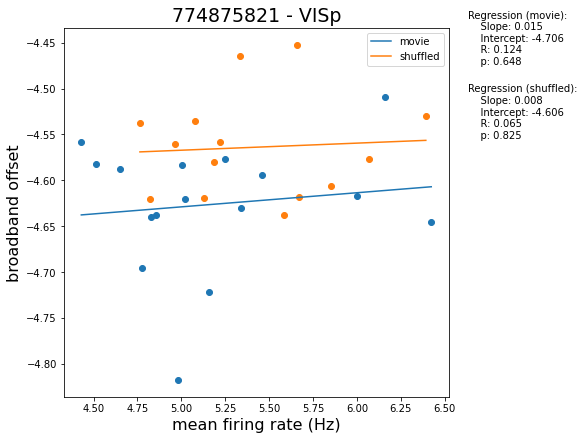

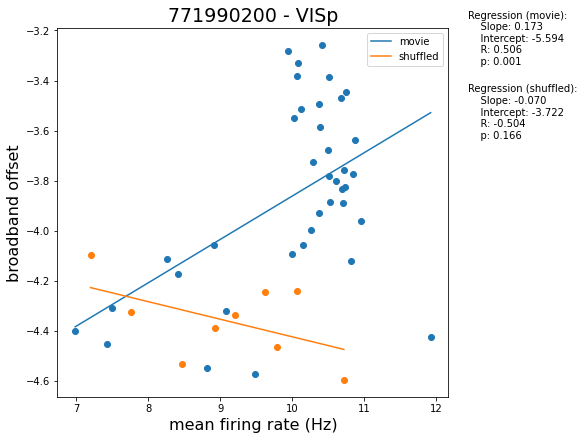

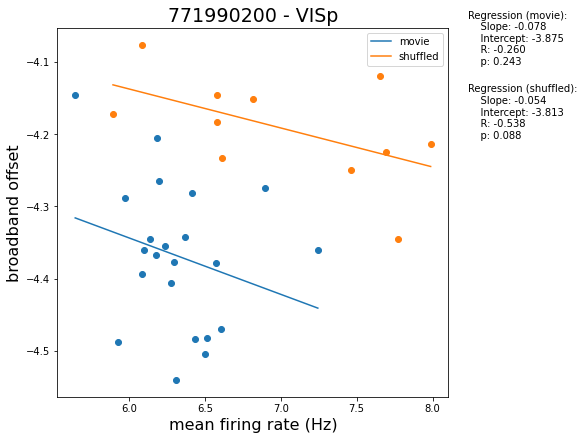

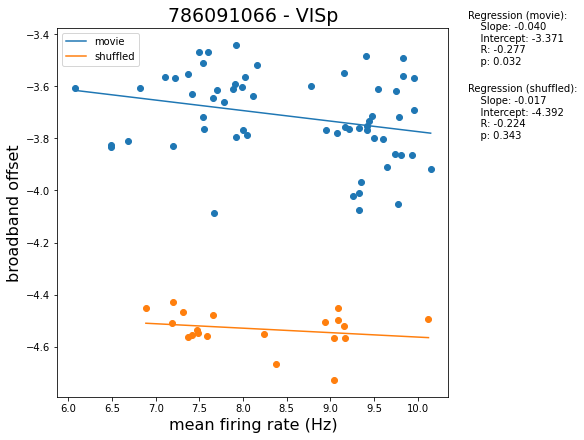

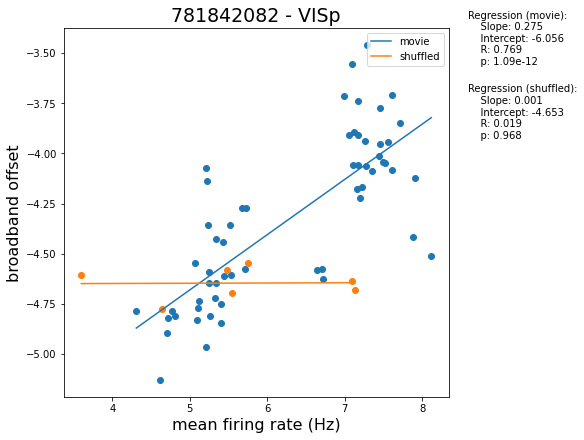

C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\scipy\stats\_stats_mstats_common.py:170: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\scipy\stats\_stats_mstats_common.py:184: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\scipy\stats\_stats_mstats_common.py:187: RuntimeWarning: invalid value encountered in double_scalars
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


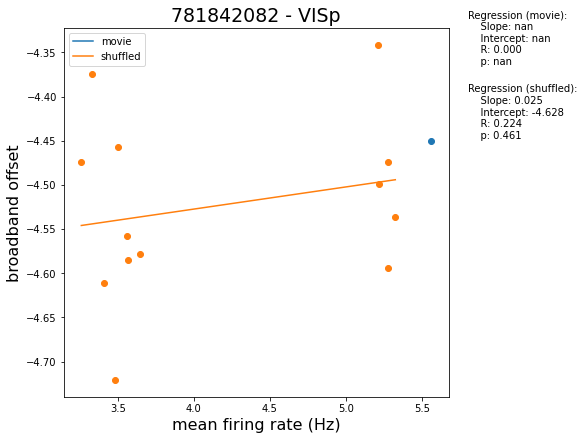

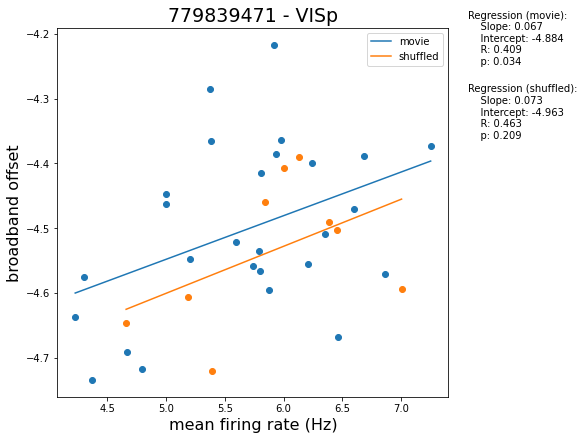

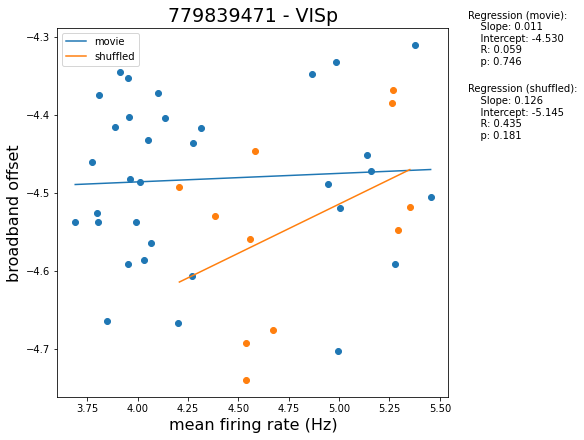

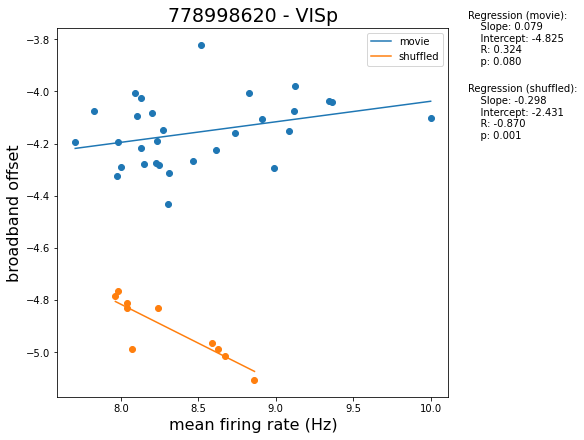

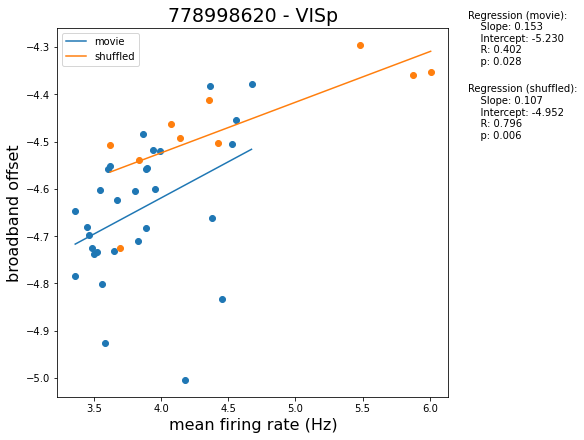

...

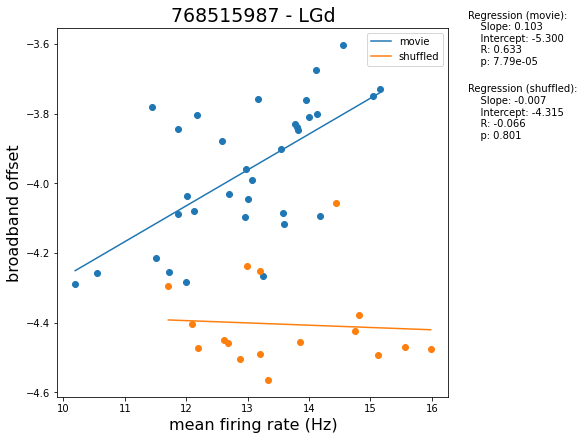

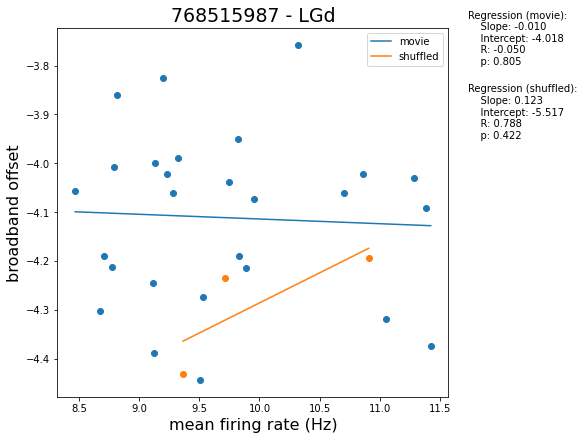

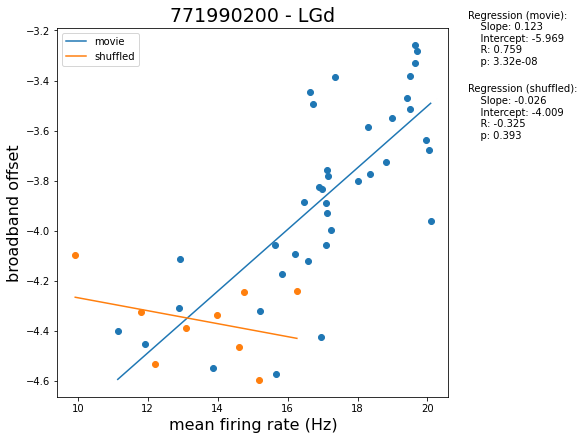

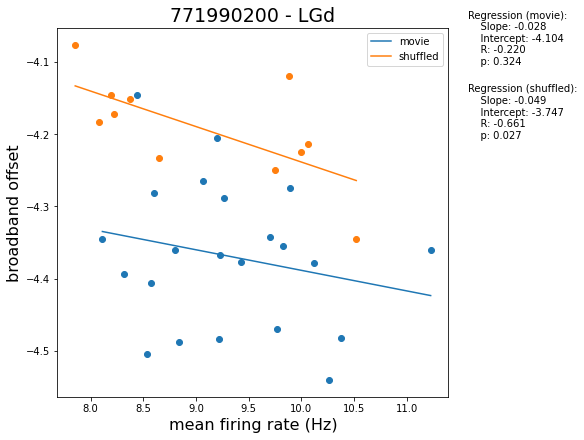

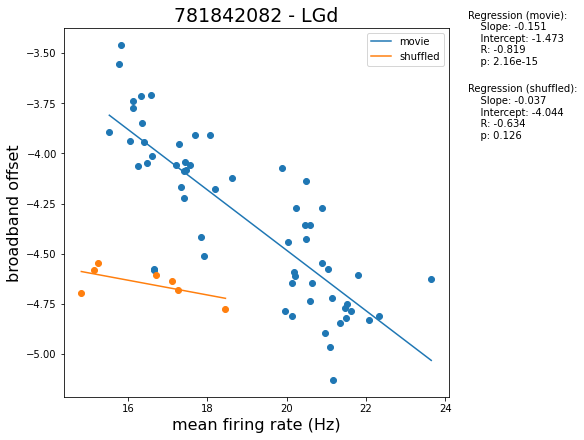

C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\scipy\stats\_stats_mstats_common.py:170: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\scipy\stats\_stats_mstats_common.py:184: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\scipy\stats\_stats_mstats_common.py:187: RuntimeWarning: invalid value encountered in double_scalars
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


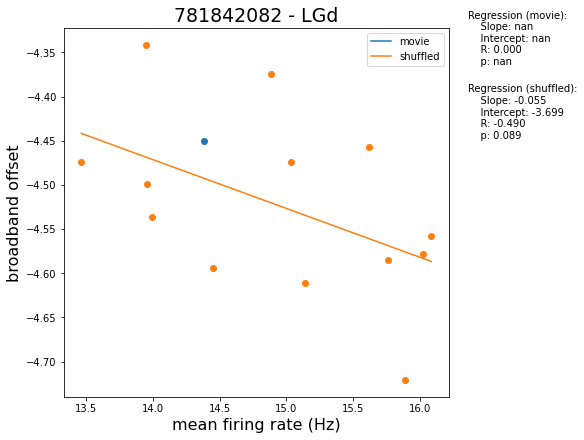

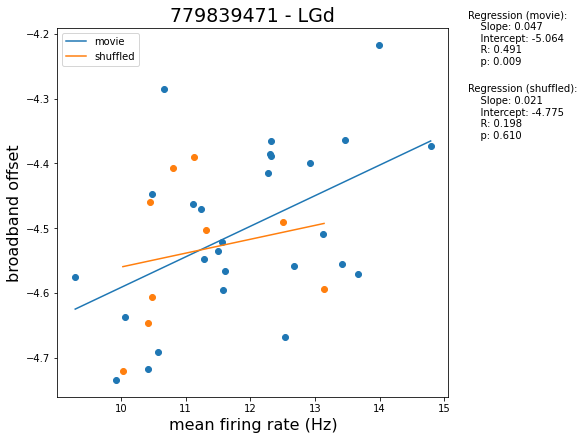

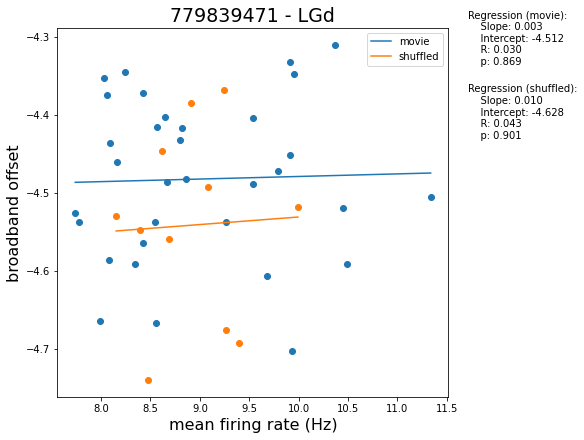

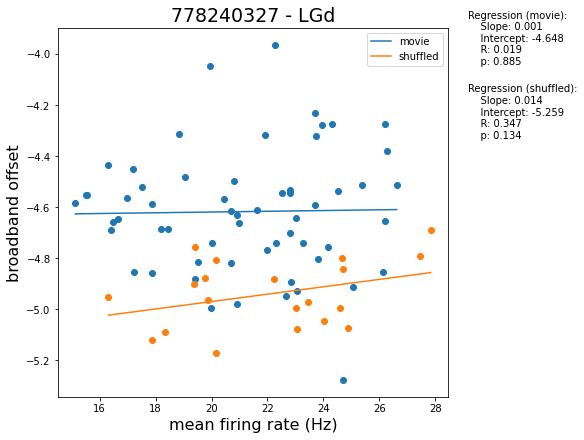

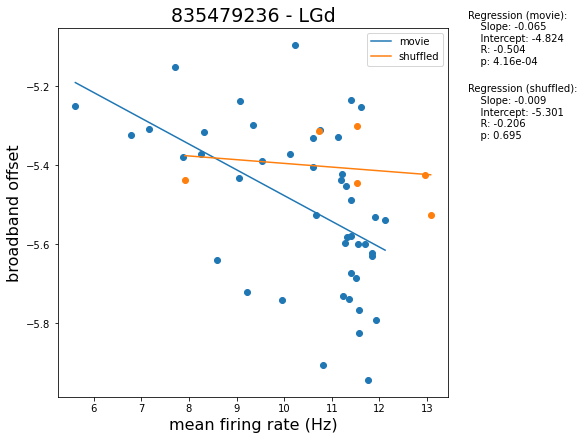

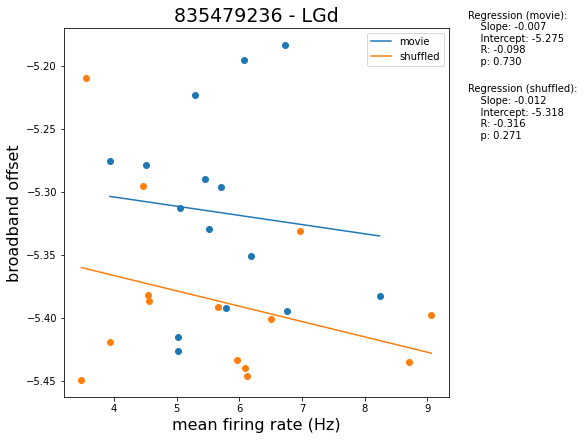

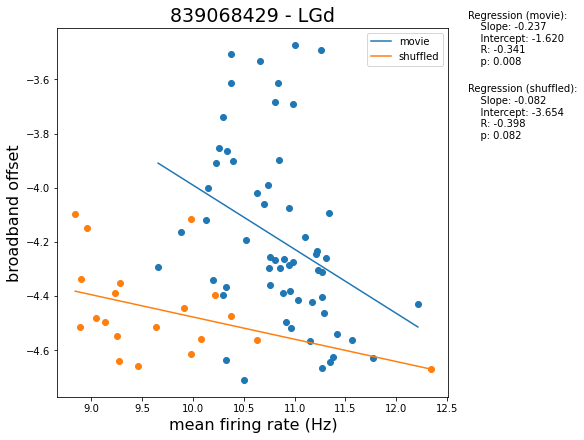

In [4]:
# Rate v offset

# loop through regions
regions = ['VISp', 'LGd']
for region in regions:
    # iterate over each session and join dataframes
    for ses_id in movie_spikes.get('session').unique():
        
        # if ses_id == 793224716 or ses_id not in movie_spikes\
        # [movie_spikes.get('brain_structure')==region].get('session').unique():
        #     continue
        
        # loop through behavioral conditions
        for behavior, running in zip(['running', 'stationary'], [True, False]):
        
            # create directory to save figures
            dir_figures = f"{PROJECT_PATH}/figures/offset_vs_rate/{region}/{behavior}"
            if not os.path.exists(f"{dir_figures}"):
                os.makedirs(f"{dir_figures}")
                
            # combine dfs with average across channels
            movie_lfp_sync = combine_spike_lfp_dfs(movie_spikes, movie_lfp, ses_id, region, state=running)
            
            # create plots
            x_movie = movie_lfp_sync.get('mean_firing_rate')
            y_movie = movie_lfp_sync.get('offset')

            # repeat for shuffled data
            shuffled_lfp_sync = combine_spike_lfp_dfs(shuffled_spikes, shuffled_lfp, ses_id, region, state=running)

            x_shuffled = shuffled_lfp_sync.get('mean_firing_rate')
            y_shuffled = shuffled_lfp_sync.get('offset')
            
            # skip if no data
            if len(movie_lfp_sync)==0 or len(shuffled_lfp_sync)==0:
                continue
                
            # create scatter plot
            scatter_2_conditions(x_movie, y_movie, x_shuffled, y_shuffled, 
                                 conditions=['movie', 'shuffled'],
                                 title=f"{ses_id} - {region}", 
                                 xlabel="mean firing rate (Hz)", 
                                 ylabel="broadband offset", 
                                 fname_out = f"{dir_figures}/{ses_id}_{region}",
                                 show=True);

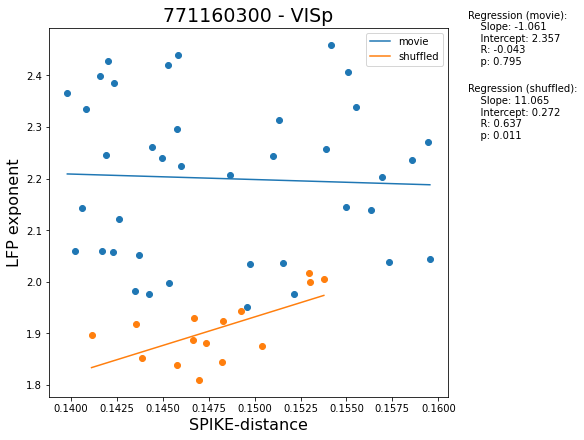

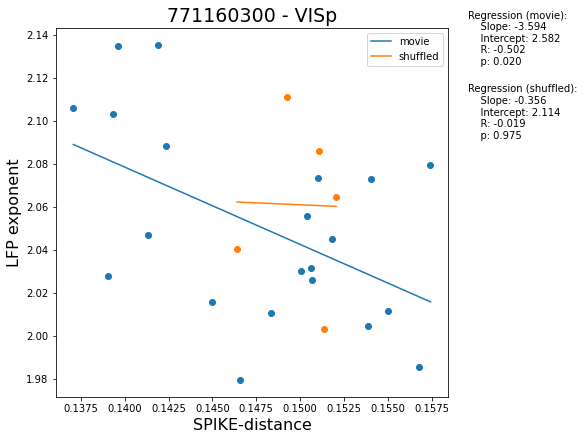

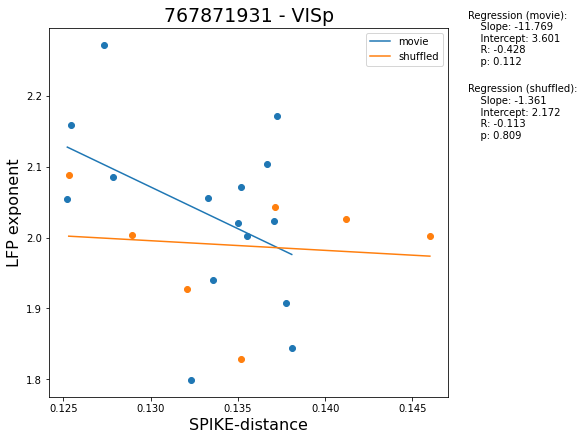

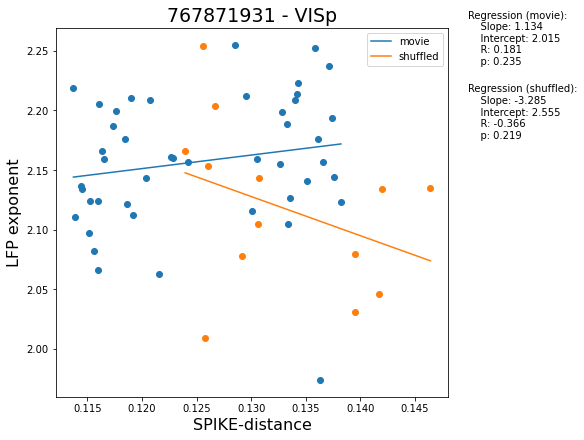

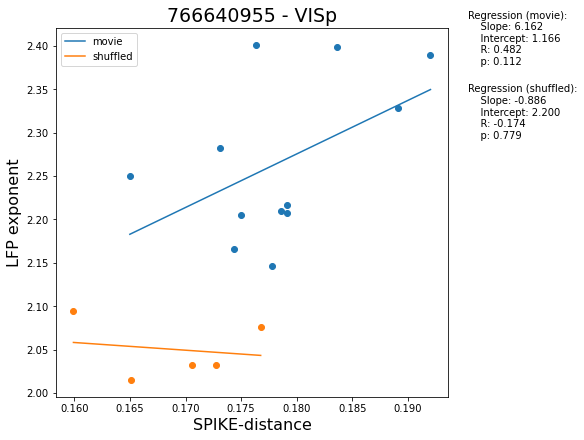

...

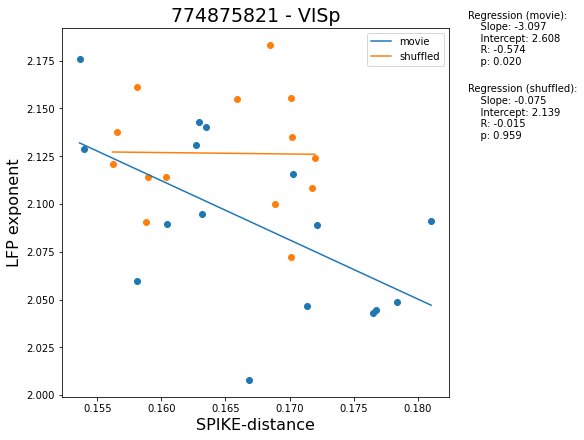

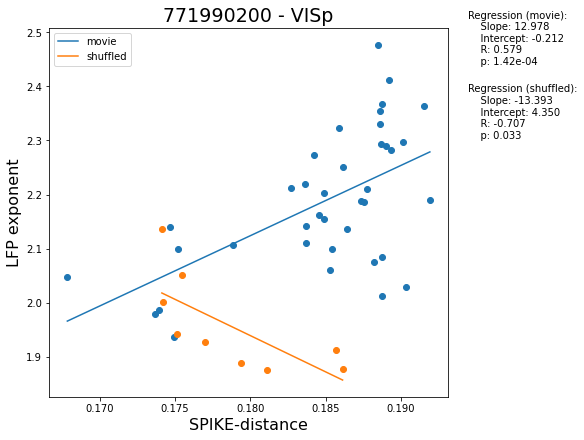

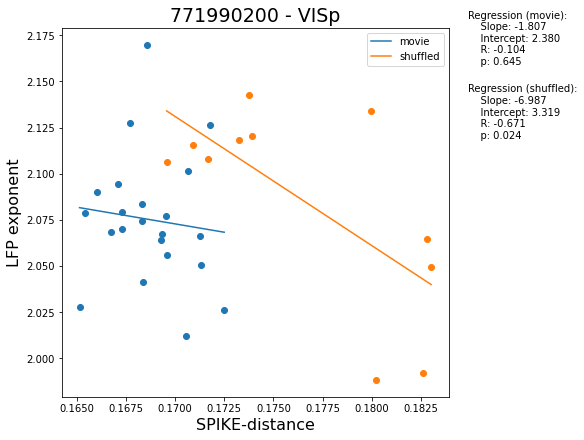

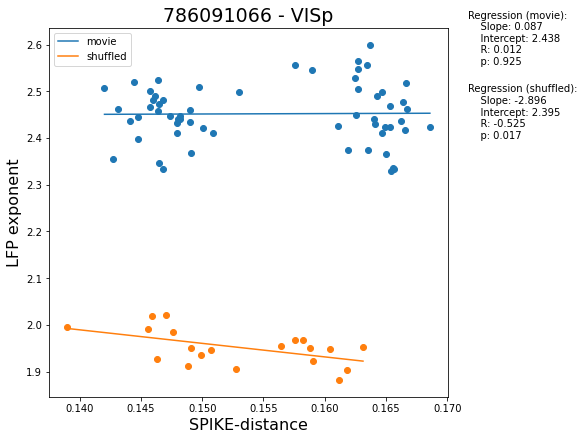

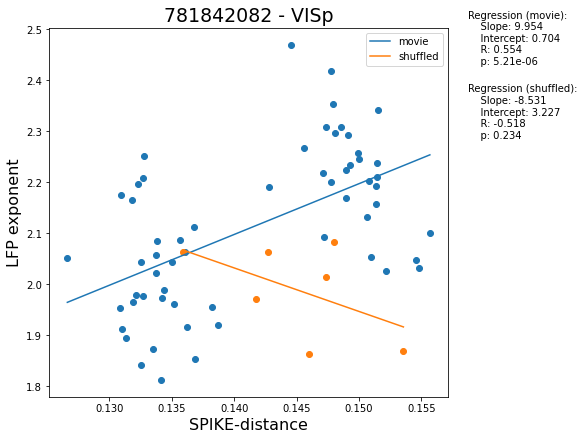

C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\scipy\stats\_stats_mstats_common.py:170: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\scipy\stats\_stats_mstats_common.py:184: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\scipy\stats\_stats_mstats_common.py:187: RuntimeWarning: invalid value encountered in double_scalars
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


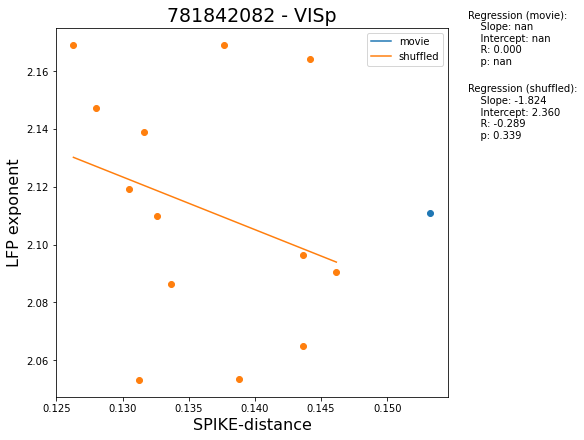

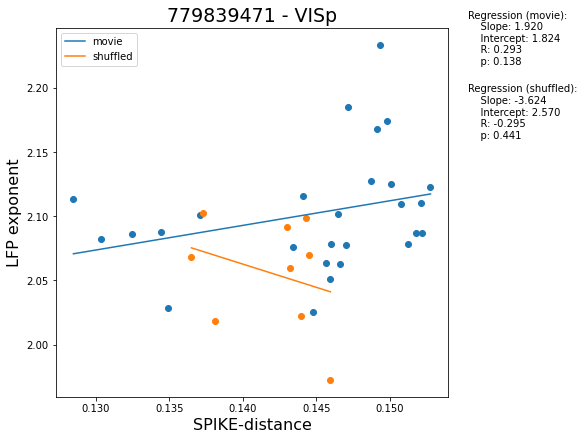

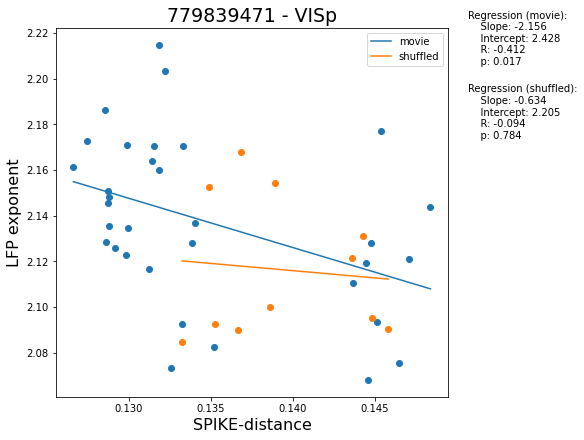

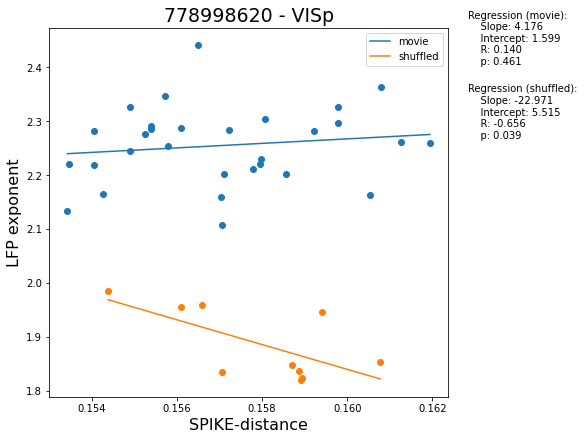

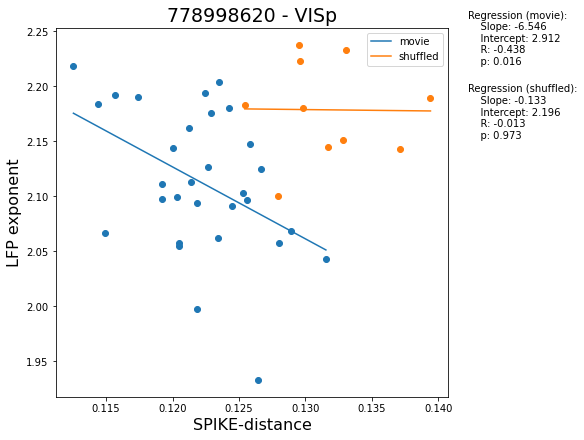

...

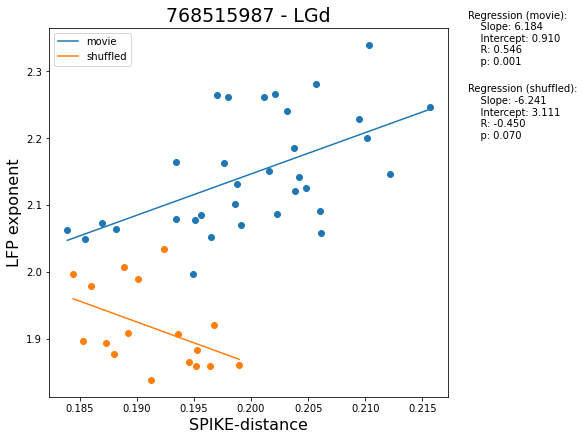

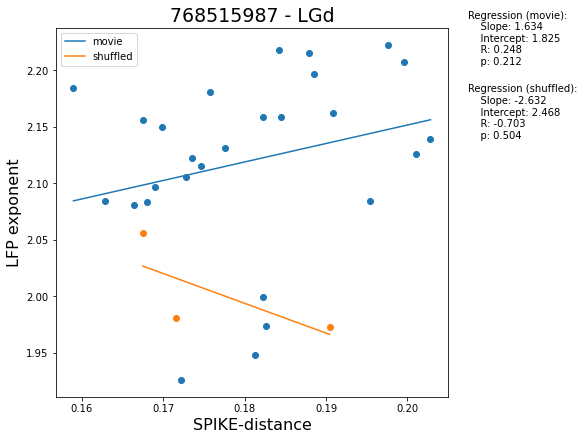

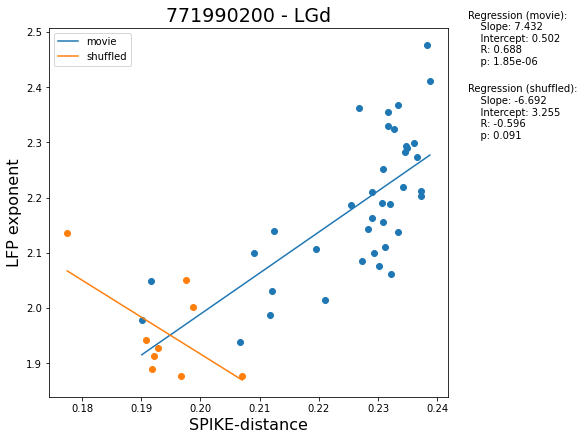

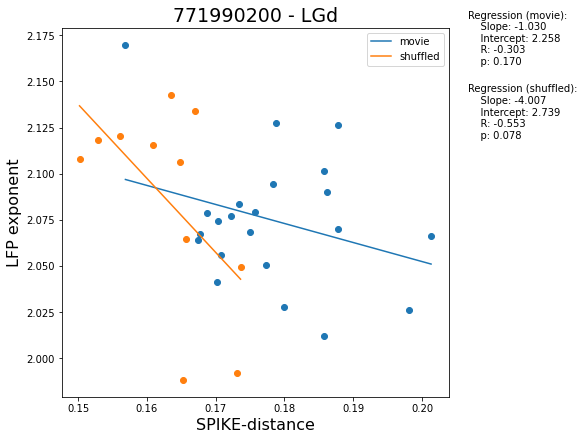

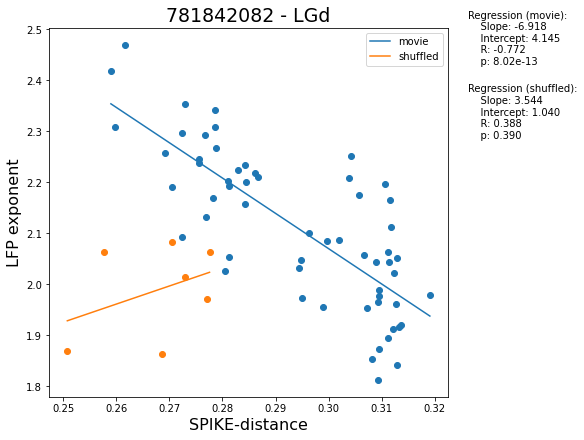

C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\scipy\stats\_stats_mstats_common.py:170: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\scipy\stats\_stats_mstats_common.py:184: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
C:\Users\micha\AppData\Roaming\Python\Python37\site-packages\scipy\stats\_stats_mstats_common.py:187: RuntimeWarning: invalid value encountered in double_scalars
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


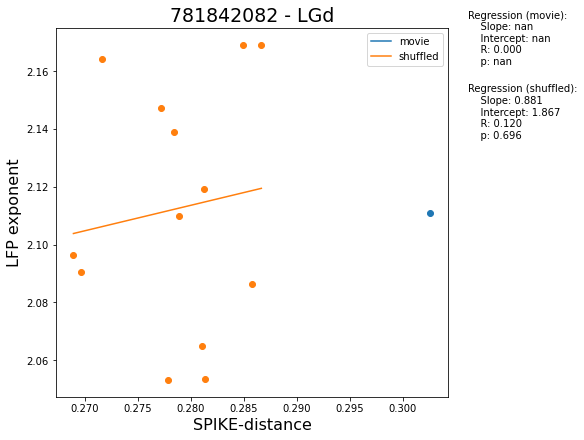

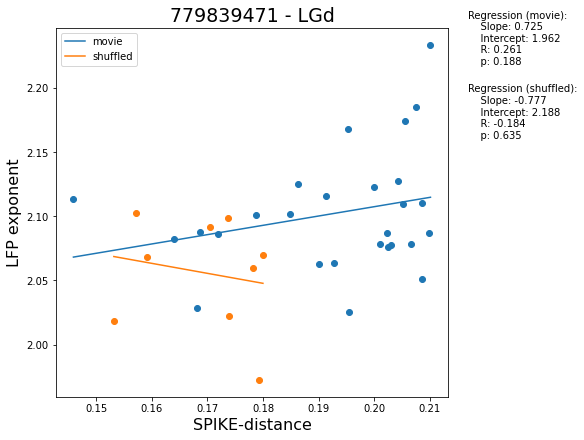

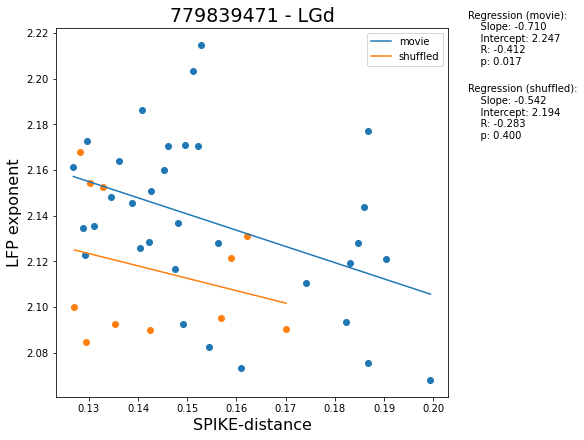

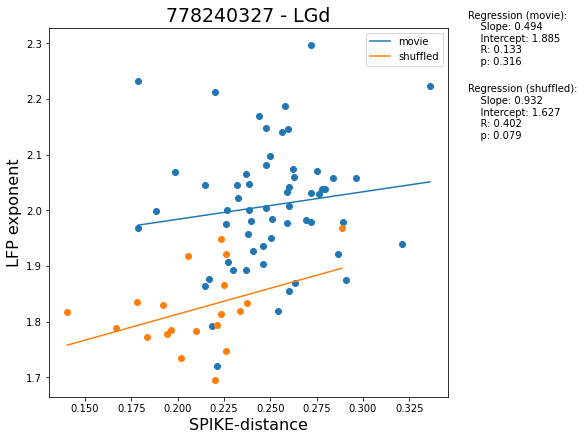

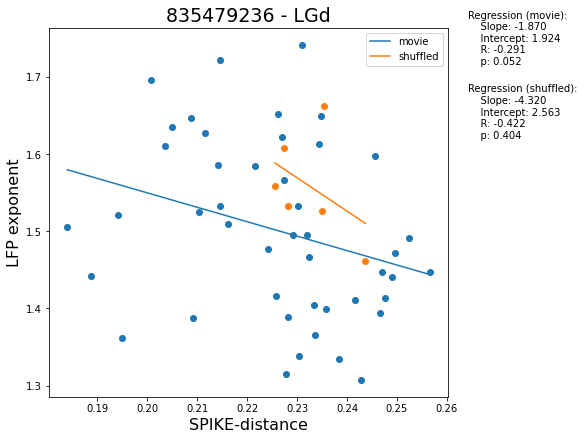

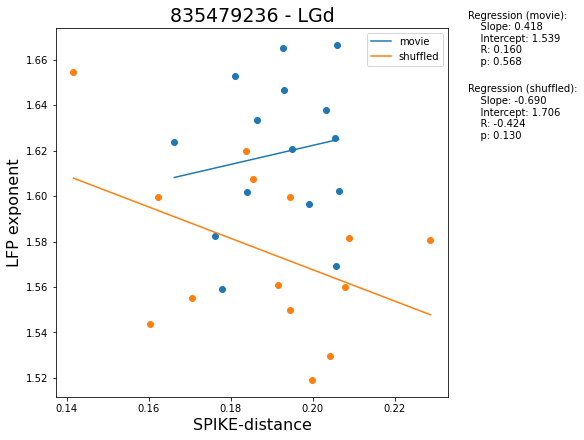

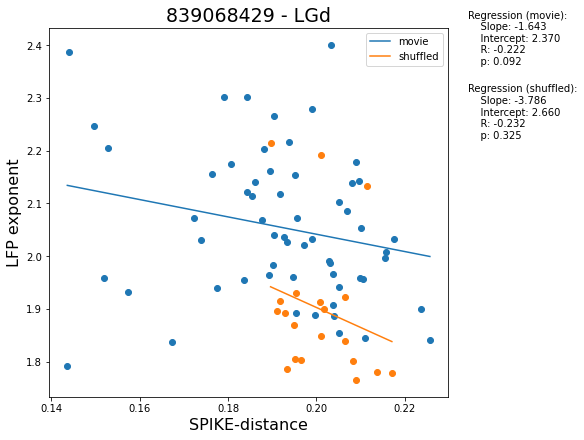

In [5]:
# Population Spike-distance v LFP spectral exponent

# loop through regions
regions = ['VISp','LGd']
for region in regions:
    # iterate over each session and join dataframes
    for ses_id in movie_spikes.get('session').unique():
        
        # if ses_id == 793224716 or ses_id not in movie_spikes\
        # [movie_spikes.get('brain_structure')==region].get('session').unique():
        #     continue
        
        # loop through behavioral conditions
        for behavior, running in zip(['running', 'stationary'], [True, False]):
        
            # create directory to save figures
            dir_figures = f"{PROJECT_PATH}/figures/exponent_vs_synchrony/{region}/{behavior}"
            if not os.path.exists(f"{dir_figures}"):
                os.makedirs(f"{dir_figures}")

            # combine dfs with average across channels
            movie_lfp_sync = combine_spike_lfp_dfs(movie_spikes, movie_lfp, ses_id, region, state=running)
            
            # create plots
            x_movie = movie_lfp_sync.get('spike_synchrony')
            y_movie = movie_lfp_sync.get('exponent')

            # repeat for shuffled data
            shuffled_lfp_sync = combine_spike_lfp_dfs(shuffled_spikes, shuffled_lfp, ses_id, region, state=running)

            x_shuffled = shuffled_lfp_sync.get('spike_synchrony')
            y_shuffled = shuffled_lfp_sync.get('exponent')
            
            if len(movie_lfp_sync)==0 or len(shuffled_lfp_sync)==0:
                continue
                
            # create scatter plot
            scatter_2_conditions(x_movie, y_movie, x_shuffled, y_shuffled, 
                                 conditions=['movie', 'shuffled'],
                                 title=f"{ses_id} - {region}", 
                                 xlabel="SPIKE-distance", 
                                 ylabel="LFP exponent", 
                                 fname_out = f"{dir_figures}/{ses_id}_{region}",
                                 show=True);

# Merge unit and LFP results

In [5]:
# modify df_lfp - average over channels for each epoch within each session

df_lfp = movie_lfp.groupby(['session', 'epoch_idx']).mean().reset_index()

# modify df_unit - drop non-VISp rows
df_units = movie_spikes.copy()
df_units = df_units[df_units.get("brain_structure")=="VISp"]    

# merge dataframes
movie_df = df_lfp.merge(df_units, on=['session', 'epoch_idx'])

#repeat for shuffled
df_lfp = shuffled_lfp.groupby(['session', 'epoch_idx']).mean().reset_index()
df_units = shuffled_spikes.copy()
df_units = df_units[df_units.get("brain_structure")=="VISp"]    
shuffled_df = df_lfp.merge(df_units, on=['session', 'epoch_idx'])

movie_df['condition'], shuffled_df['condition'] = 'movie', 'shuffled'

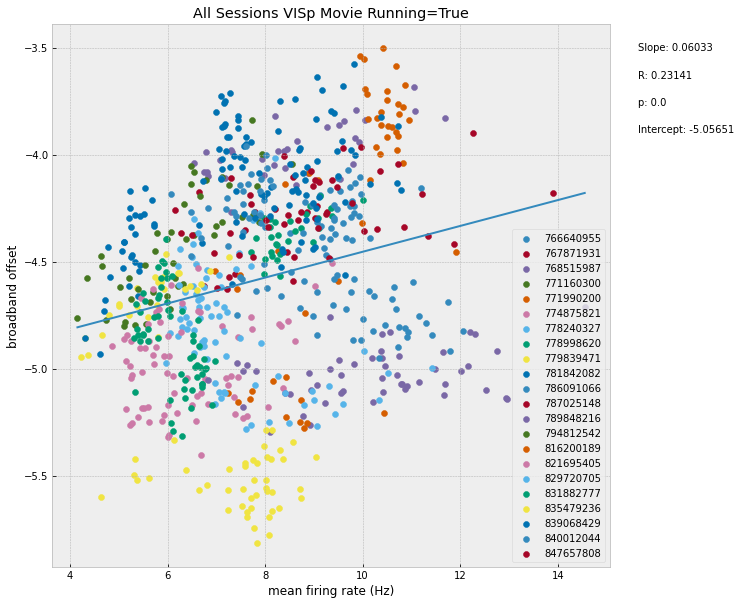

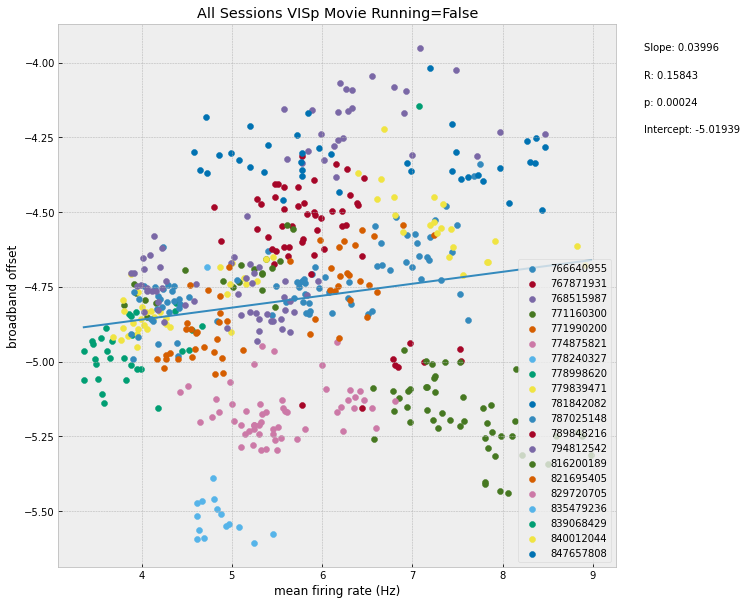

In [8]:
# Plot mean firing rate vs. broadband offset 

for running in [True, False]:
    #filter for behavior
    behav_df = movie_df[movie_df.get('running')==running]
    
    # plot each session
    sessions = behav_df.get('session').unique()
    fig, ax = plt.subplots(figsize=(10, 10))
    for ses in sessions:
        ses_df = behav_df[behav_df.get('session')==ses]
        ax.scatter(ses_df.get('mean_firing_rate'), ses_df.get('offset'), label=ses)
    ax.legend()

    # run regression across all epochs and plot results
    x_data = behav_df.get('mean_firing_rate')
    y_data = behav_df.get('offset')
    results = sts.linregress(x_data, y_data)
    l1 = np.linspace(min(x_data), max(x_data), 1000)
    t1 = results.slope * l1 + results.intercept
    ax.plot(l1, t1, label='natural_movie (1)')

    # add labels
    plt.text(1.05, 0.95, f"Slope: {round(results.slope, 5)}", transform = ax.transAxes)
    plt.text(1.05, 0.9, f"R: {round(results.rvalue, 5)}", transform = ax.transAxes)
    plt.text(1.05, 0.85, f"p: {round(results.pvalue, 5)}", transform = ax.transAxes)
    plt.text(1.05, 0.8, f"Intercept: {round(results.intercept, 5)}", transform = ax.transAxes)

    plt.xlabel("mean firing rate (Hz)")
    plt.ylabel("broadband offset")

    plt.title(f"All Sessions VISp Movie Running={running}")
    
    if running:
        dir_figures = dir_base + '/running'
    else: 
        dir_figures = dir_base + '/stationary'

    plt.savefig(f"{dir_figures}/movie_all_sessions")

In [6]:
df = pd.concat([movie_df, shuffled_df])
df.head()

,session,epoch_idx,offset,knee,exponent,r_squared,cf_0,pw_0,bw_0,cf_1,...,mean_firing_rate,unit_firing_rates,coefficient_of_variation,spike_distance,spike_synchrony,correlation_coefficient,epoch_times,running,brain_structure,condition
0,766640955,0.0,-4.860576,1188.476113,1.938520,0.920563,16.315592,0.527971,4.110032,67.971192,...,7.613462,"[9.933333333333334, 4.866666666666666, 2.3, 0....",1.397554,0.373022,0.166795,[[ 1. 0.06956156 0.03174138 ... 0.0...,"[array(2297.21288415) * s, array(2327.21288415...",False,VISp,movie
1,766640955,1.0,-4.840959,243.044655,1.958613,0.928544,16.089610,0.408364,4.154759,77.684014,...,6.503846,"[12.866666666666667, 3.033333333333333, 1.9333...",1.805933,0.356343,0.156179,[[ 1. 0.28654797 -0.11920837 ... -0.2...,"[array(2327.23768415) * s, array(2357.23796415...",False,VISp,movie
2,766640955,2.0,-4.734913,448.006152,2.018242,0.929696,20.044242,0.327437,3.952711,68.648654,...,5.717949,"[7.333333333333333, 2.433333333333333, 1.83333...",2.085702,0.355914,0.144663,[[ 1. 0.52801102 -0.43696716 ... -0.2...,"[array(2357.26309415) * s, array(2387.26328415...",False,VISp,movie
3,766640955,3.0,-4.808460,120.219652,1.976962,0.929683,14.305838,0.325696,6.565642,111.696998,...,6.325000,"[5.066666666666666, 2.5, 1.4, 0.36666666666666...",2.286680,0.356209,0.150416,[[ 1. 0.30124503 -0.1708901 ... -0.2...,"[array(2387.28808415) * s, array(2417.28815415...",False,VISp,movie
4,766640955,4.0,-4.841887,410.098697,1.968394,0.929065,30.627458,0.353131,4.655083,83.828503,...,5.859615,"[6.433333333333334, 2.933333333333333, 1.53333...",1.927220,0.360086,0.148029,[[ 1. 0.19865689 -0.15139859 ... -0.2...,"[array(2417.31288415) * s, array(2447.31325415...",False,VISp,movie



Regression results: movie
LinregressResult(slope=0.060334677001167056, intercept=-5.056513910341158, rvalue=0.23140868920455715, pvalue=5.920700935370815e-11, stderr=0.009087981681878925, intercept_stderr=0.07316741587535051)

Regression results: shuffled
LinregressResult(slope=0.039631603474068855, intercept=-5.196369742585704, rvalue=0.21350461985730293, pvalue=0.0006784246472238703, stderr=0.01151535501763426, intercept_stderr=0.09484217547065957)


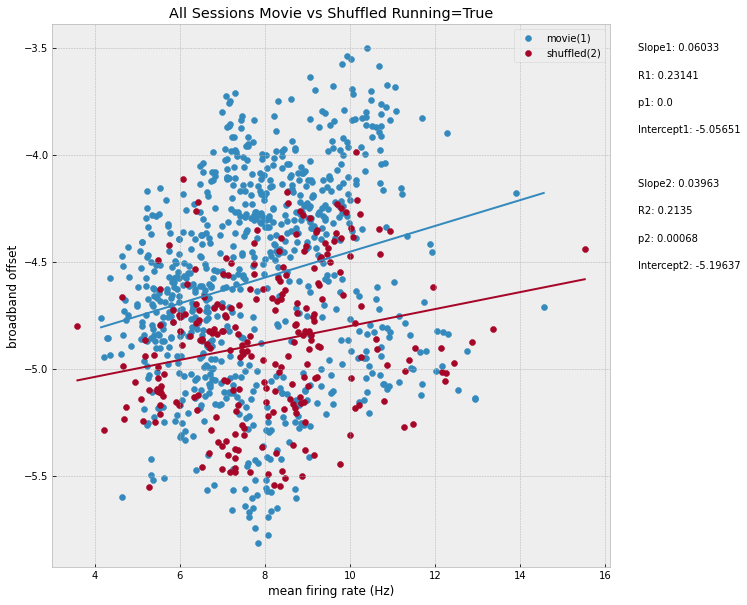


Regression results: movie
LinregressResult(slope=0.03995885921775575, intercept=-5.019391682161655, rvalue=0.15842855990576957, pvalue=0.00024043583504380415, stderr=0.010807182075857314, intercept_stderr=0.06298862672072494)

Regression results: shuffled
LinregressResult(slope=0.016888803729655448, intercept=-5.013598478106463, rvalue=0.07469706518793476, pvalue=0.30830367645559165, stderr=0.016531942225522483, intercept_stderr=0.1025215563851308)


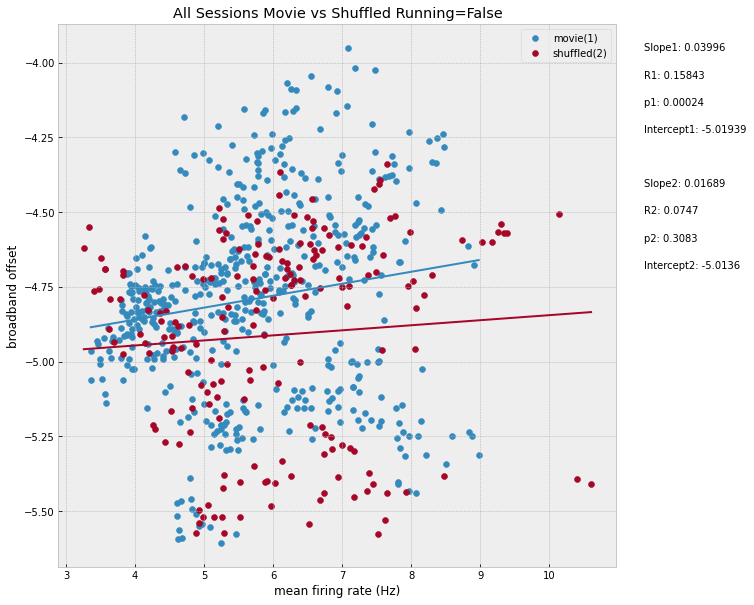

In [10]:
for running in [True, False]:
    #filter for behavior
    behav_df = df[df.get('running')==running]
    
    # plot mean firing rate vs. broadband offset for each condition

    # create figure and label axes
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_xlabel('mean firing rate (Hz)')
    ax.set_ylabel('broadband offset')
    plt.title(f"All Sessions Movie vs Shuffled Running={running}")

    # plot each condition
    for i, condition in enumerate(behav_df.get('condition').unique()):
        # plot scatter for each condition
        df_cond = behav_df[behav_df.get('condition')==condition]
        ax.scatter(df_cond.get('mean_firing_rate'), df_cond.get('offset'), label=condition + f"({i+1})")

        # run regression for both conditions and plot results
        x_data = df_cond.get('mean_firing_rate')
        y_data = df_cond.get('offset')
        results = sts.linregress(x_data, y_data)
        line_x = np.linspace(min(x_data), max(x_data), 1000)
        line_y = results.slope * line_x + results.intercept
        ax.plot(line_x, line_y)

        # print results
        print(f"\nRegression results: {condition}")
        print(results)

        # add labels
        plt.text(1.05, 0.95 - (i*0.25), f"Slope{i+1}: {round(results.slope, 5)}", transform = ax.transAxes)
        plt.text(1.05, 0.9 - (i*0.25), f"R{i+1}: {round(results.rvalue, 5)}", transform = ax.transAxes)
        plt.text(1.05, 0.85 - (i*0.25), f"p{i+1}: {round(results.pvalue, 5)}", transform = ax.transAxes)
        plt.text(1.05, 0.8 - (i*0.25), f"Intercept{i+1}: {round(results.intercept, 5)}", transform = ax.transAxes)

        
    if running:
        dir_figures = dir_base + '/running'
    else: 
        dir_figures = dir_base + '/stationary'
                  
    plt.savefig(f"{dir_figures}/movie_v_shuffled_all_sessions")

    # add legend
    ax.legend()
    plt.show();

In [11]:
# ANOVA

In [71]:
# eliminate sessions without > 1 true and false running values or trials != 80
df_sessions = df
for session in df_sessions.get('session').unique():
    ses_df = df_sessions[df_sessions.get('session')==session]
    if (len(ses_df[ses_df.get('running') == True]) <= 1) | (len(ses_df[ses_df.get('running') == False]) <= 1) | (len(ses_df) != 80):
        df_sessions = df_sessions[df_sessions.get('session')!=session]

In [70]:
# loop over variables of interest
results = {}
for var in ['mean_firing_rate', 'offset', 'knee', 'exponent', 'coefficient_of_variation',
                 'spike_synchrony', 'spike_distance']:
    # run anova
    results_i = sm.stats.AnovaRM(df_sessions, var, 'session', within=['condition', 'running'], aggregate_func='mean').fit()

    # aggregate
    results[var] = results_i

    # show results
    print(f"\n\n===================  {var}  ===================\n")
    print(results_i)



===================  mean_firing_rate  ===================

                     Anova
                  F Value Num DF  Den DF Pr > F
-----------------------------------------------
condition          0.3811 1.0000 15.0000 0.5463
running           58.4683 1.0000 15.0000 0.0000
condition:running  7.6429 1.0000 15.0000 0.0145



===================  offset  ===================

                     Anova
                  F Value Num DF  Den DF Pr > F
-----------------------------------------------
condition         43.9388 1.0000 15.0000 0.0000
running           11.4986 1.0000 15.0000 0.0040
condition:running 16.6787 1.0000 15.0000 0.0010



===================  knee  ===================

                     Anova
                  F Value Num DF  Den DF Pr > F
-----------------------------------------------
condition         12.8841 1.0000 15.0000 0.0027
running           11.4936 1.0000 15.0000 0.0040
condition:running 11.7343 1.0000 15.0000 0.0038



===================  exponent 

# Frequency Range Analysis

In [2]:
# create directory to save figures
for stimulus in ['natural_movie', 'natural_movie_shuffled']:
    for behavior in ['running', 'stationary']:
        for mask_status in ['masked', 'non_masked']:
            dirs = f"{PROJECT_PATH}/figures/sensitivity_analysis/{stimulus}/{behavior}/{mask_status}"
            if not os.path.exists(dirs):
                os.makedirs(dirs)

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

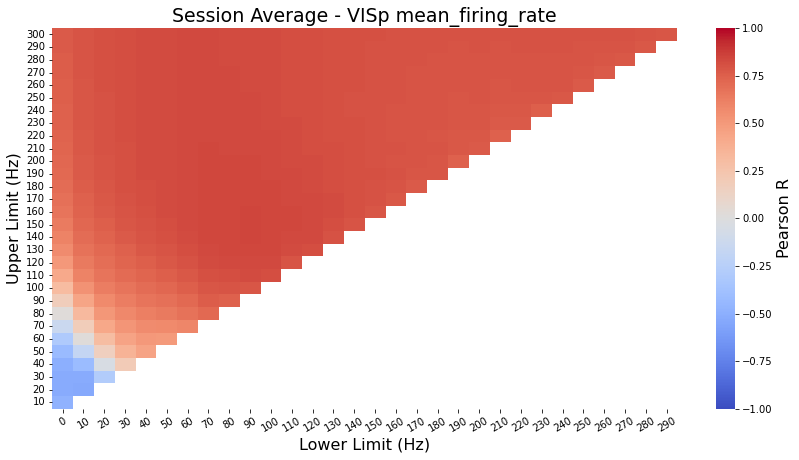

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

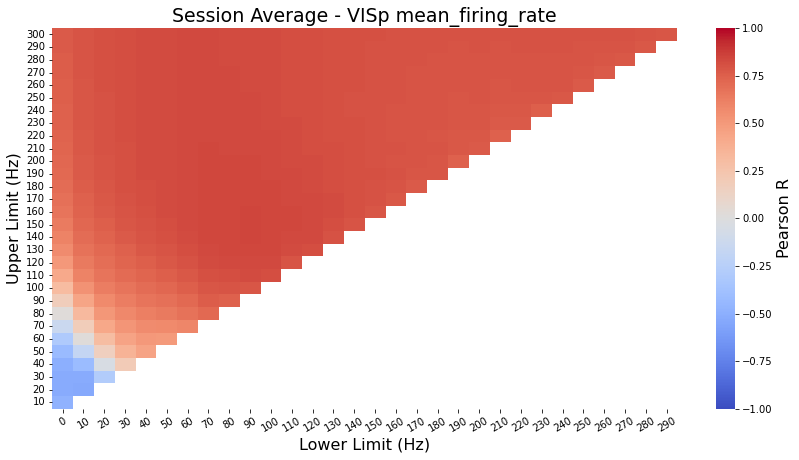

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.np

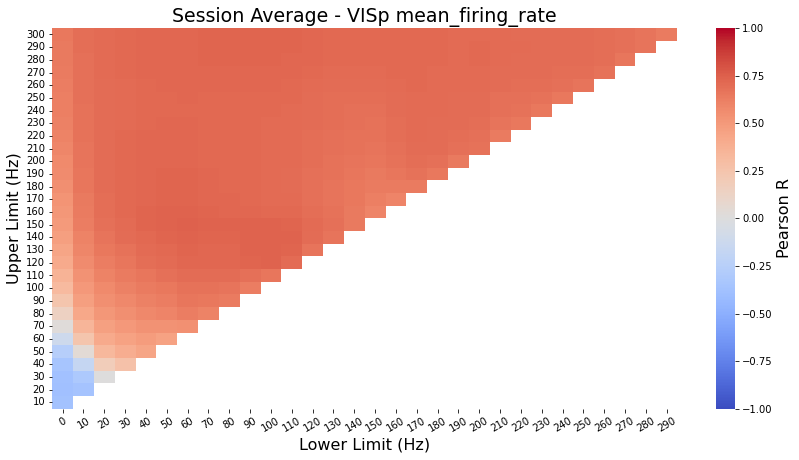

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.np

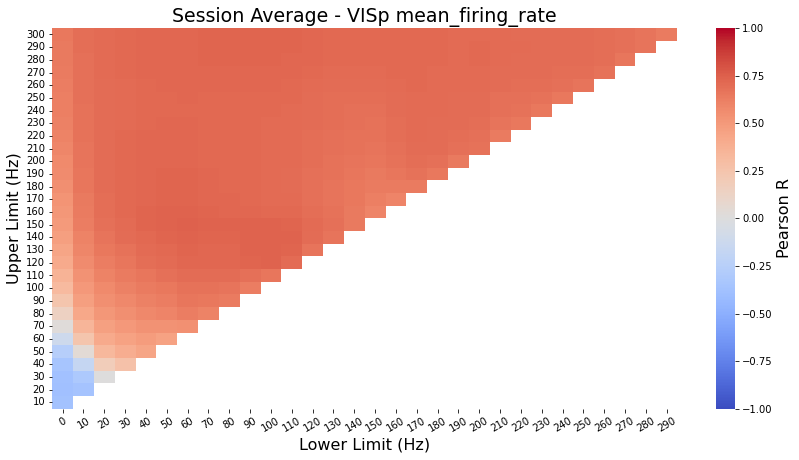

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

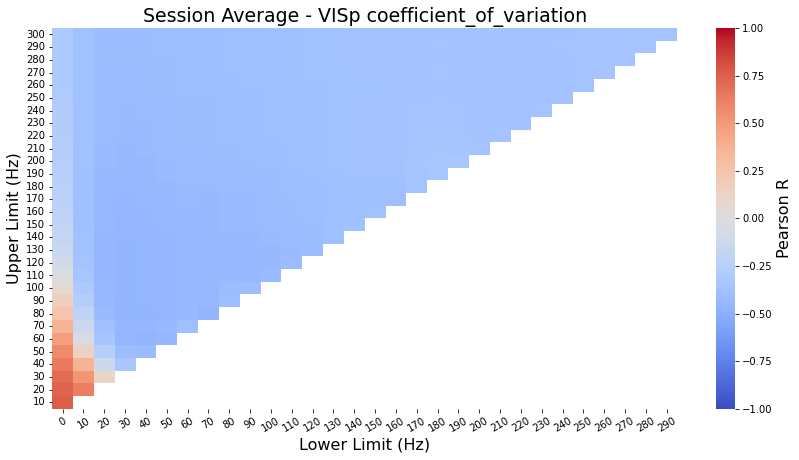

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

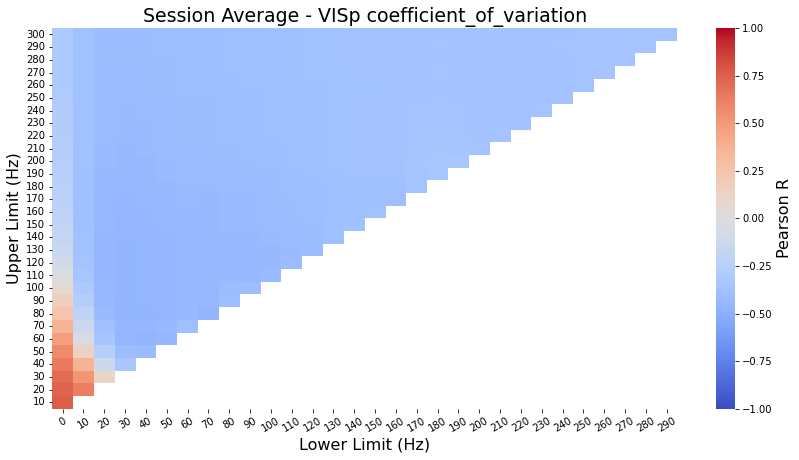

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.np

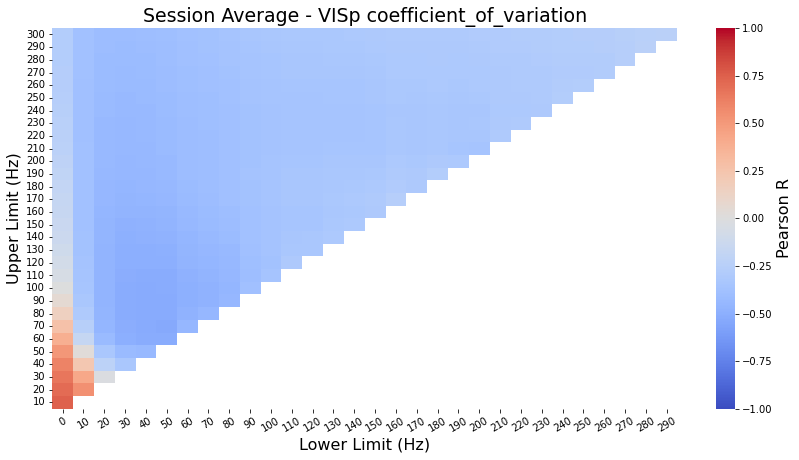

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.np

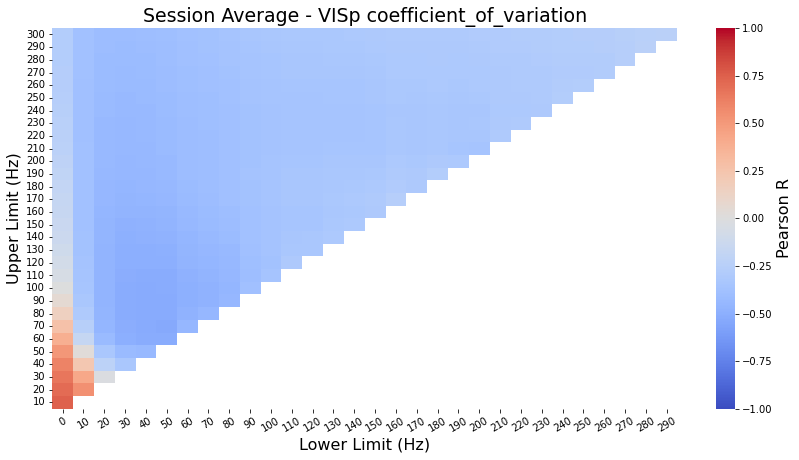

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

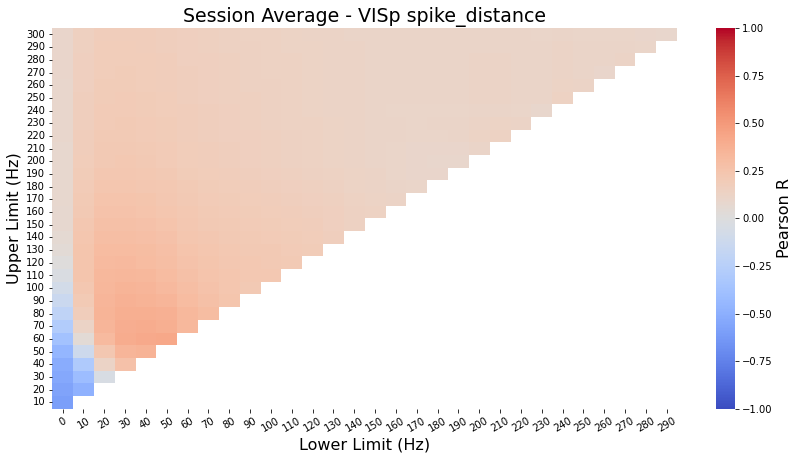

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

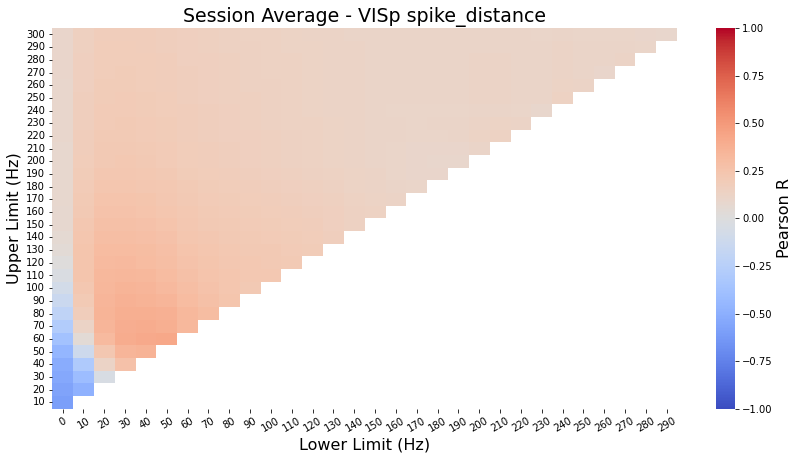

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.np

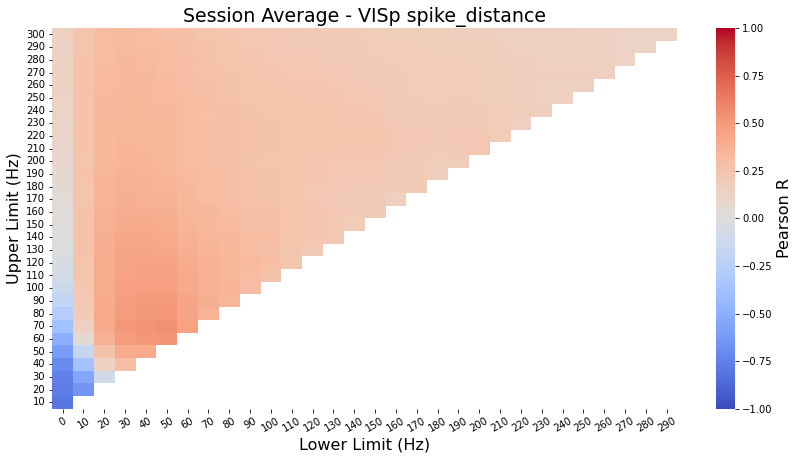

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.np

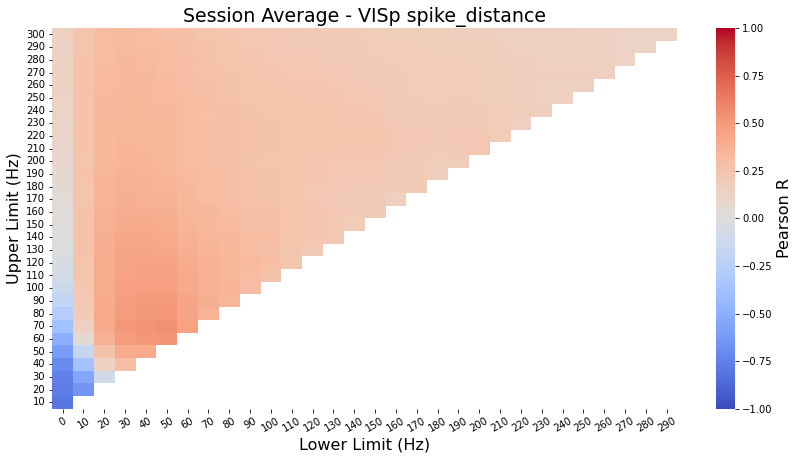

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

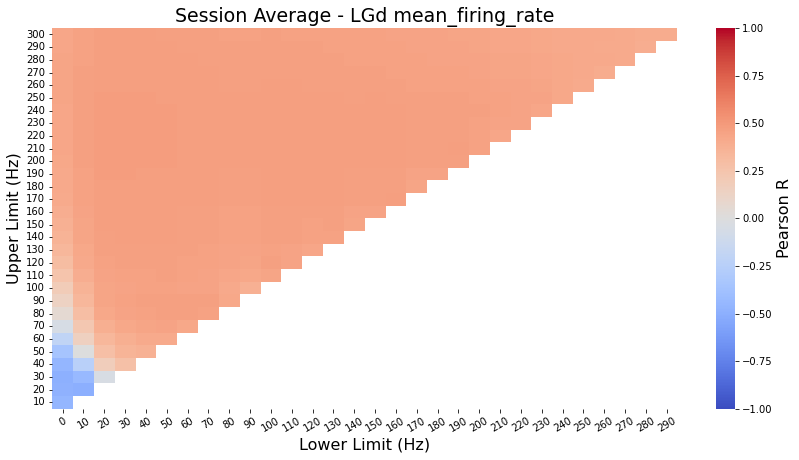

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

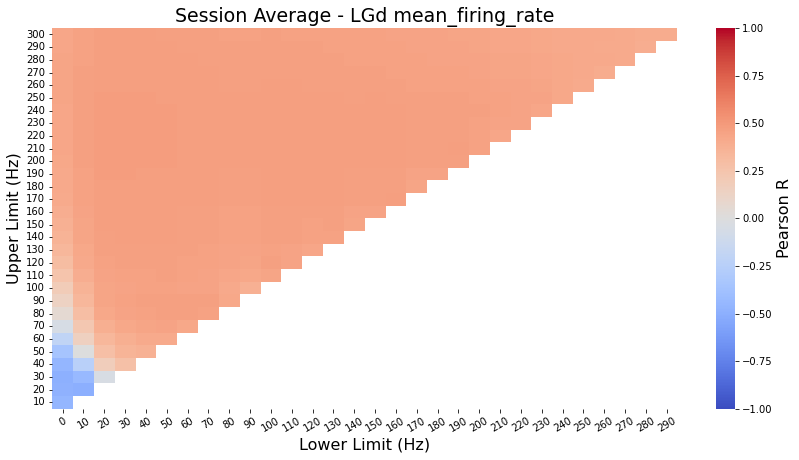

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.np

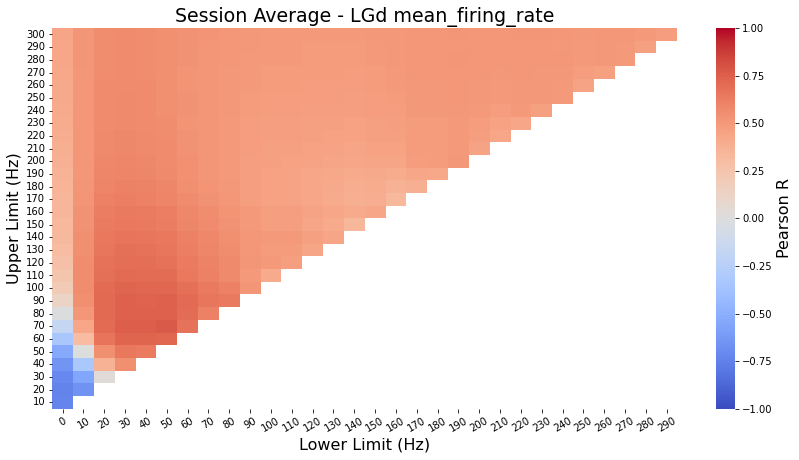

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.np

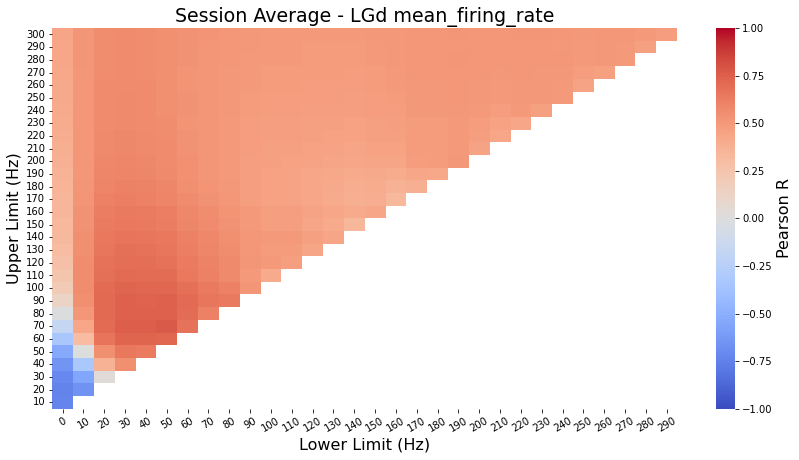

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

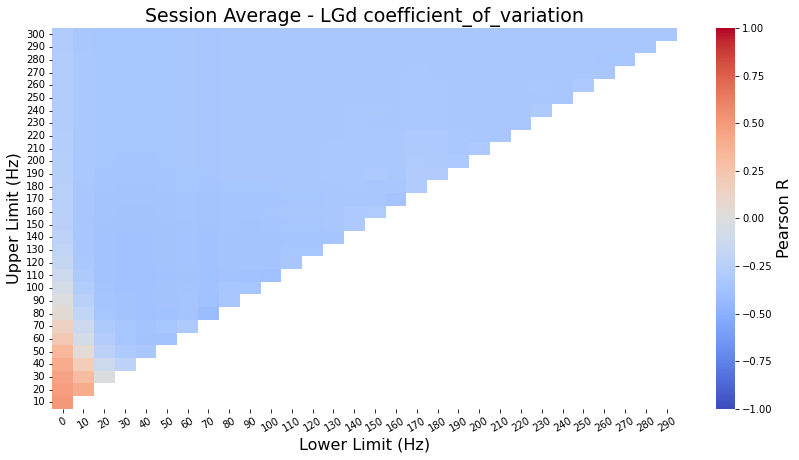

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

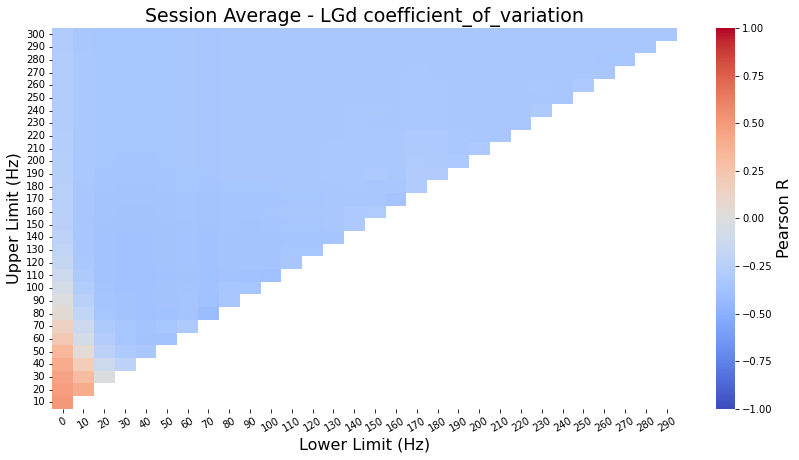

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.np

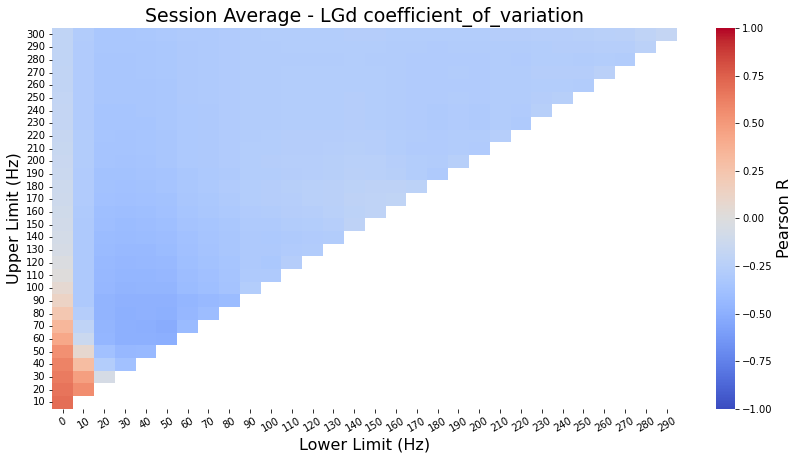

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.np

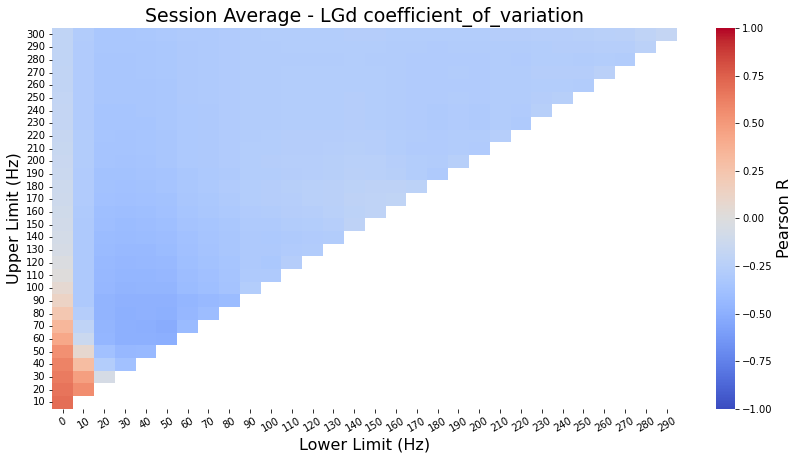

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

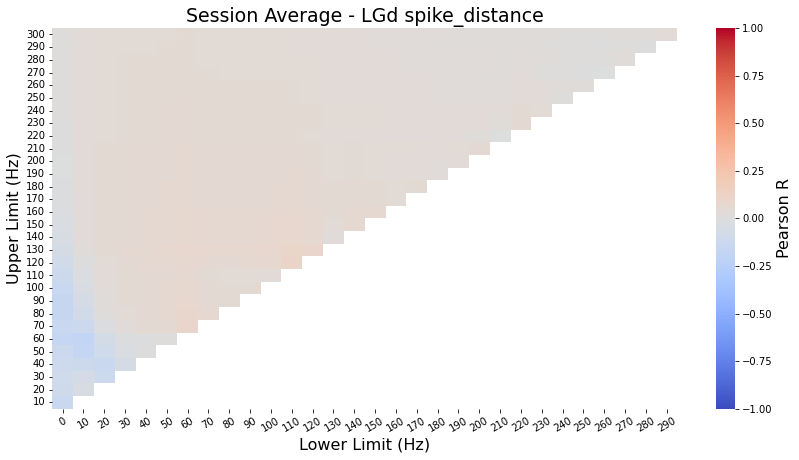

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

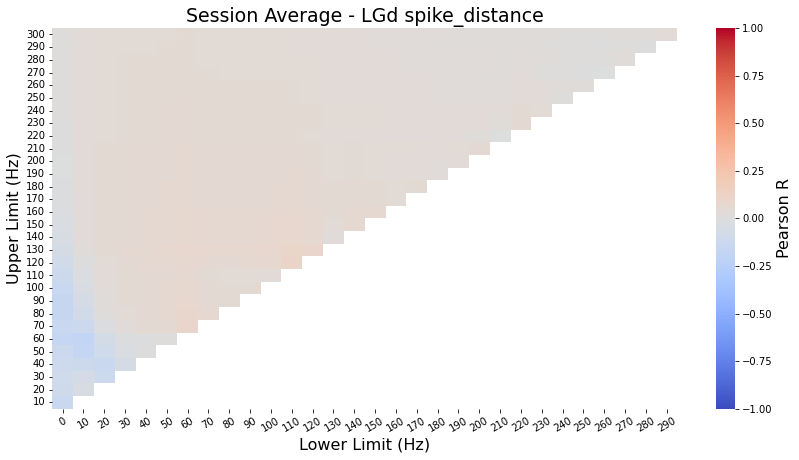

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.np

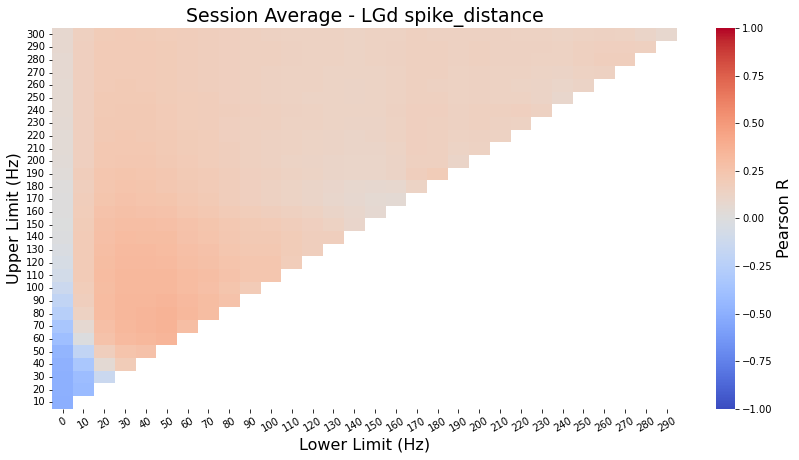

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Not enough data!	 # points: 1
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.np

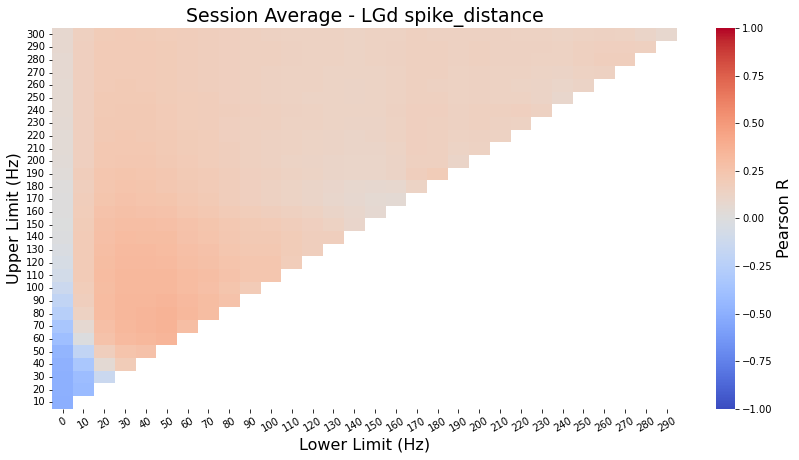

In [72]:
# natural_movie_one_more_repeats
movie_psd = f'{PSD_PATH}/natural_movie'
movie_spikes = f'{SPIKES_IN}/VISp-LGd_natural_movie.csv'
    
metrics = ['mean_firing_rate', 'coefficient_of_variation', 'spike_distance']
regions = ['VISp', 'LGd']
run_states = [True, False]

dir_base = f"{PROJECT_PATH}/figures/sensitivity_analysis/natural_movie"

for region in regions:
    for metric in metrics:
        for running in run_states:
            
            if running:
                dir_figures = f"{dir_base}/running"
            else:
                dir_figures = f"{dir_base}/stationary"
                
            sensitivity_analysis(metric, region, movie_psd, movie_spikes, running=running,
                                 dir_figures = f"{dir_figures}/non_masked",
                                plot_sessions=True, mask_nonsig=False);
            sensitivity_analysis(metric, region, movie_psd, movie_spikes, running=running,
                                 dir_figures = f"{dir_figures}/masked",
                                plot_sessions=True, mask_nonsig=True);

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

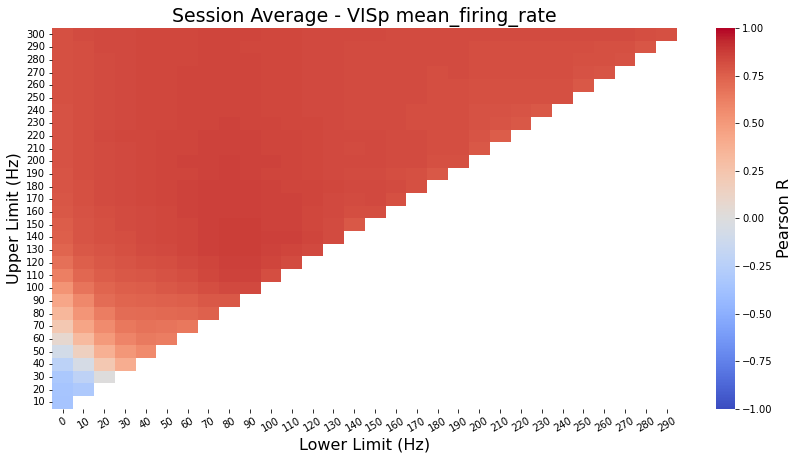

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

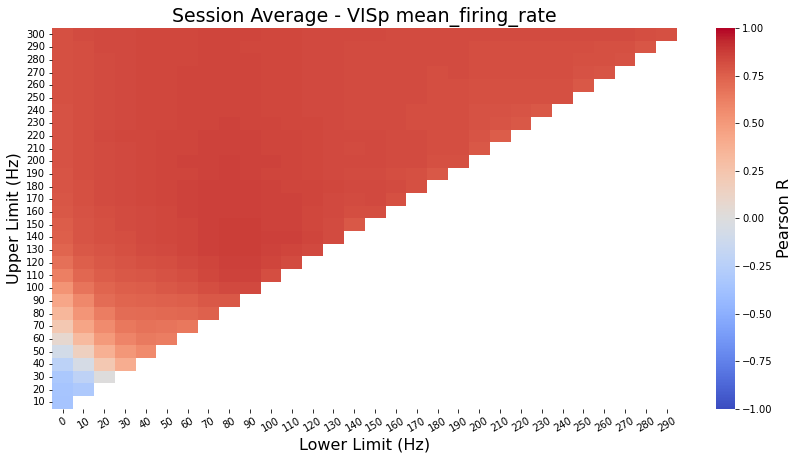

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

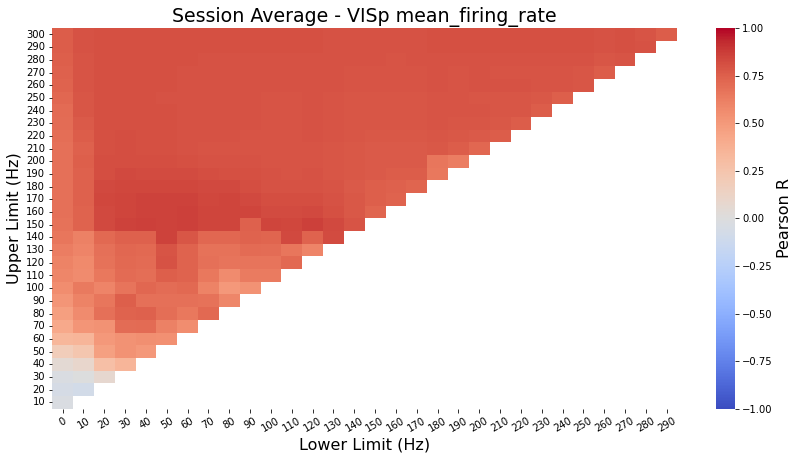

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

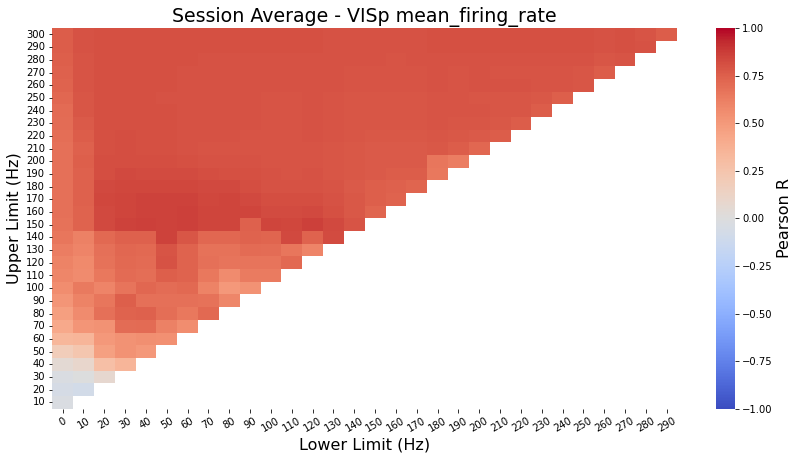

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

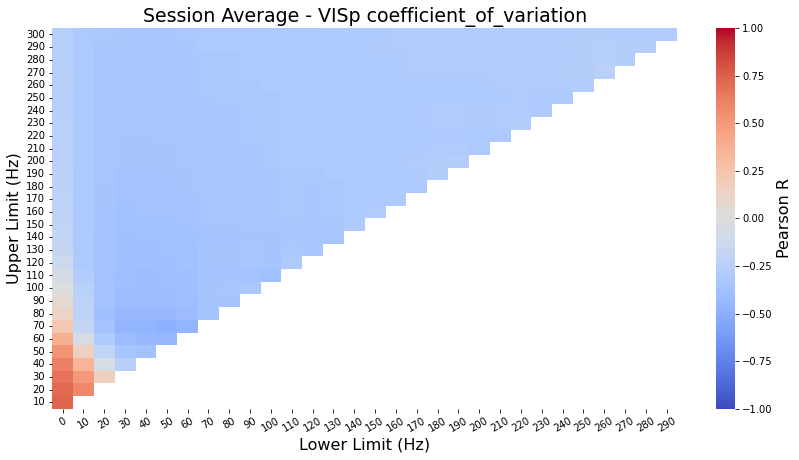

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

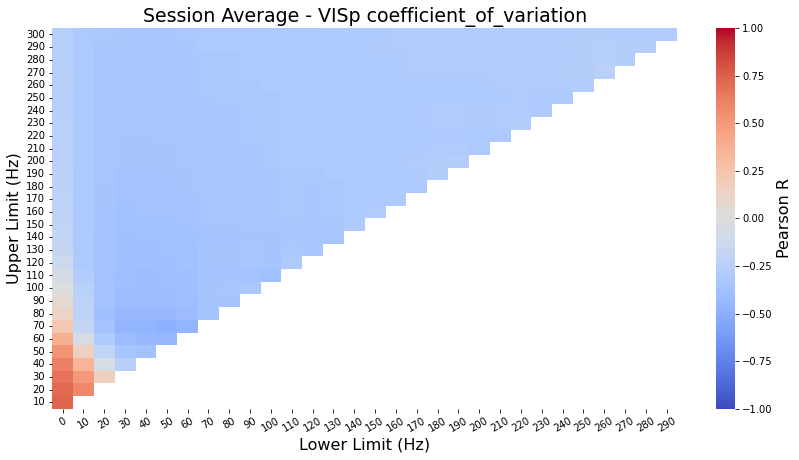

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

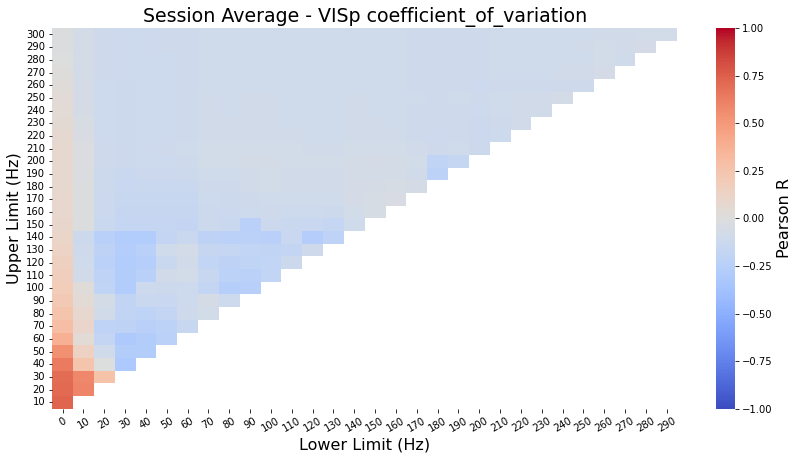

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

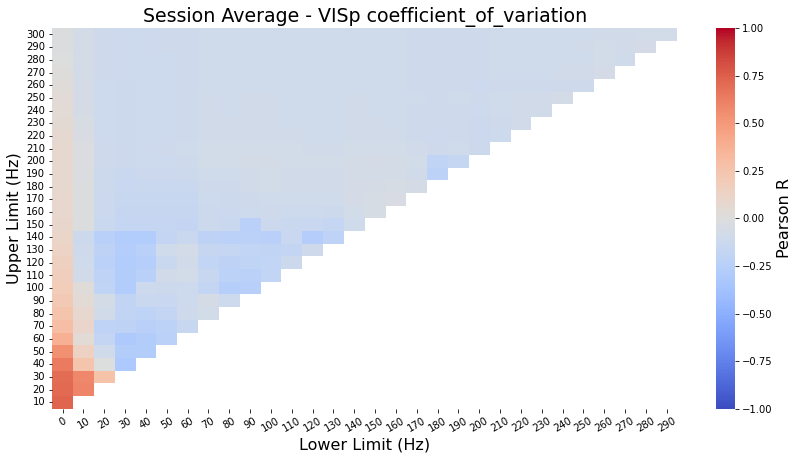

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

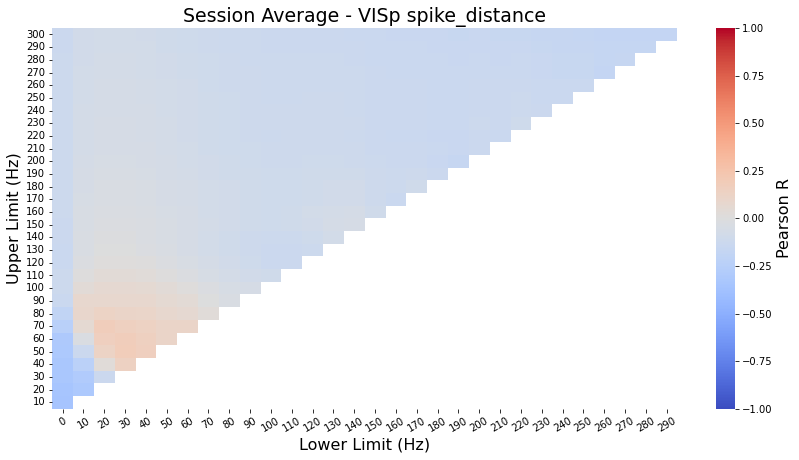

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

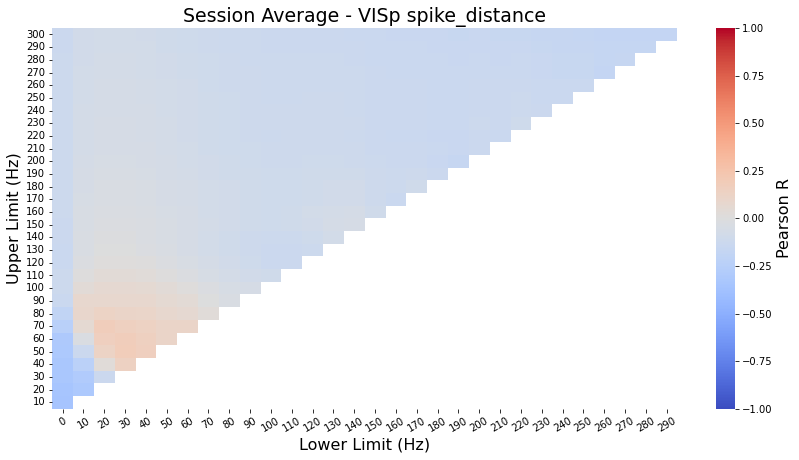

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

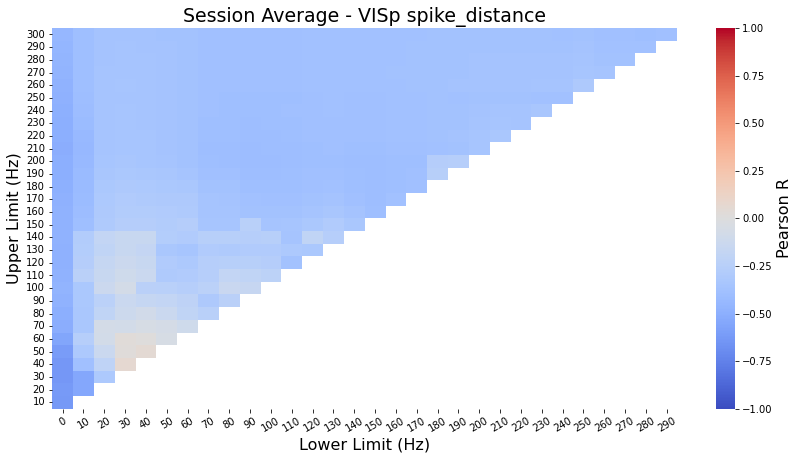

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

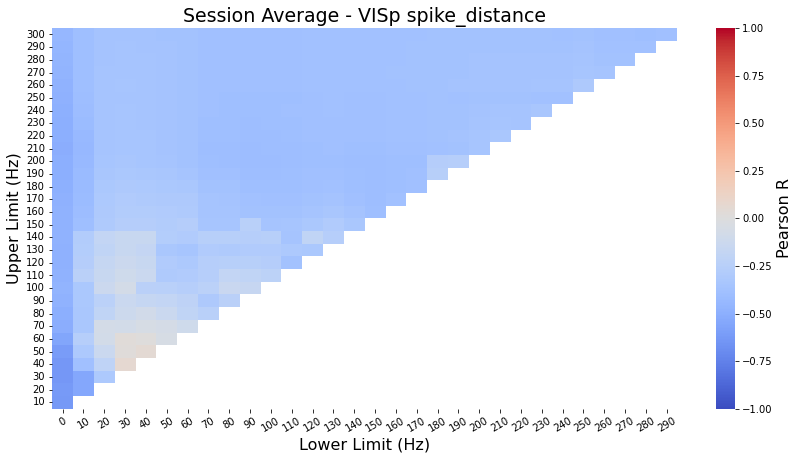

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

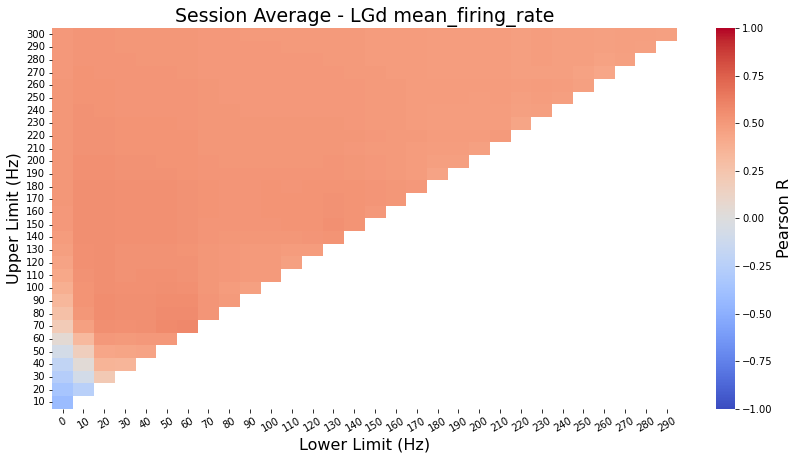

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

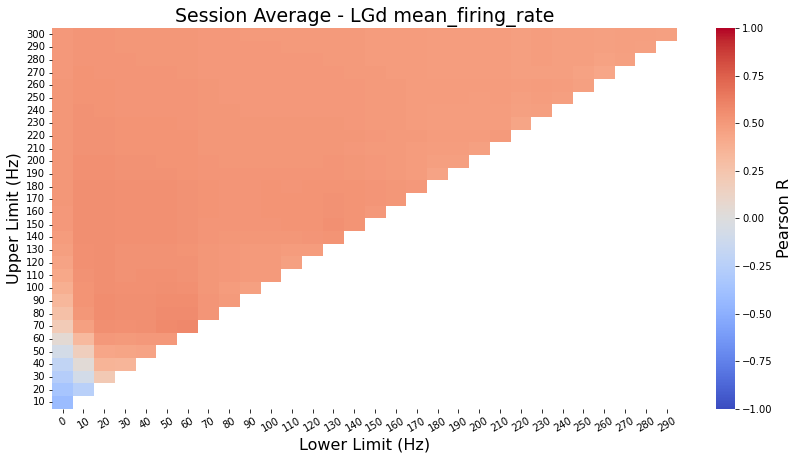

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

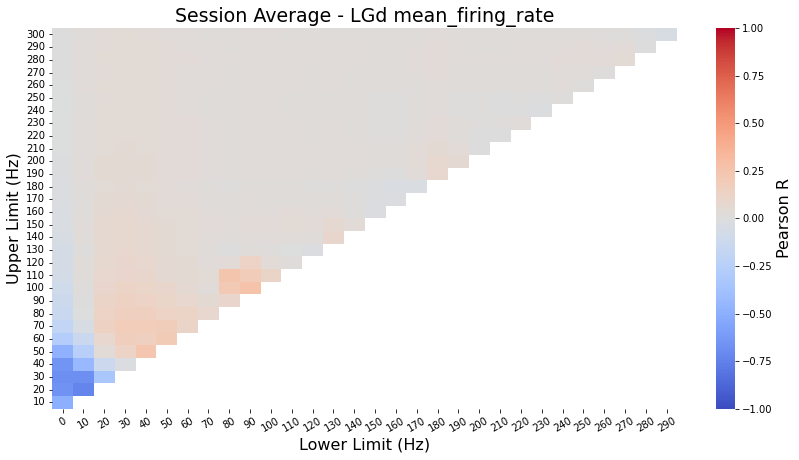

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

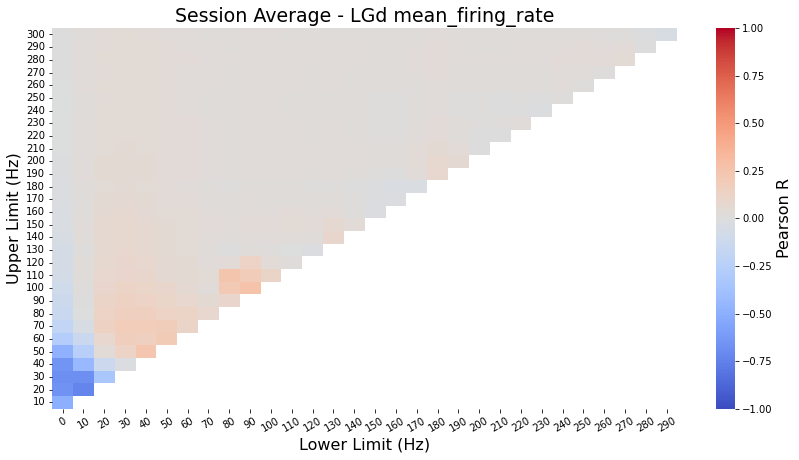

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

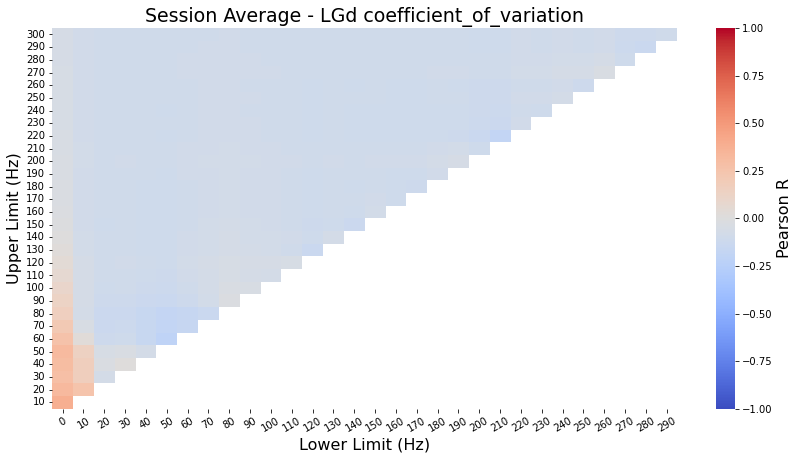

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

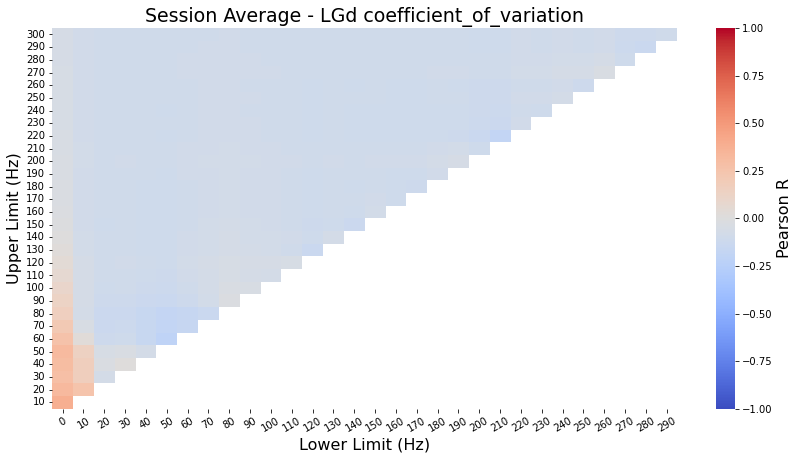

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

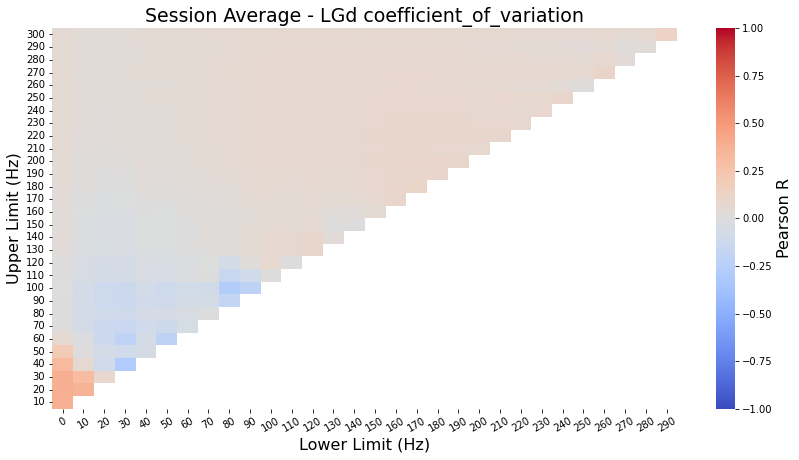

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

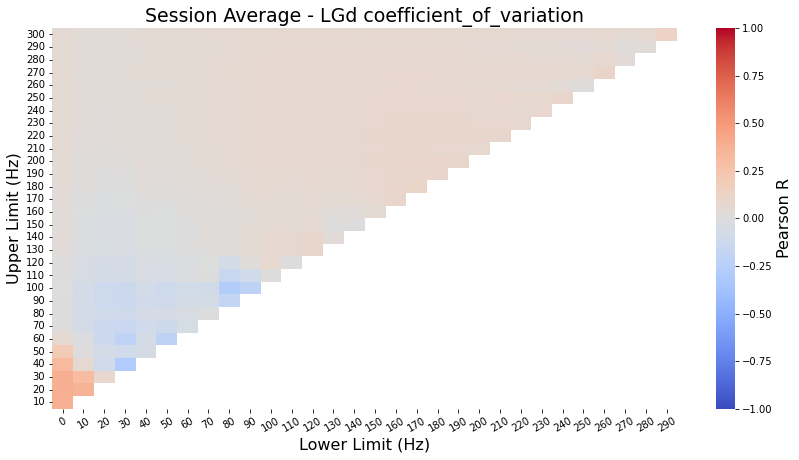

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

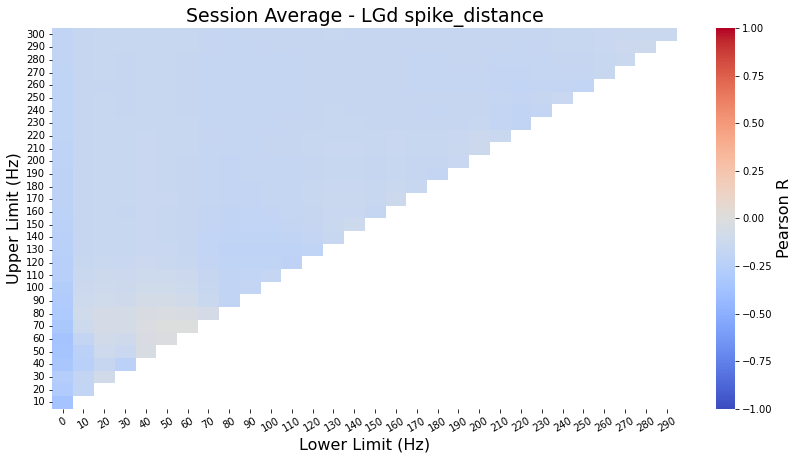

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

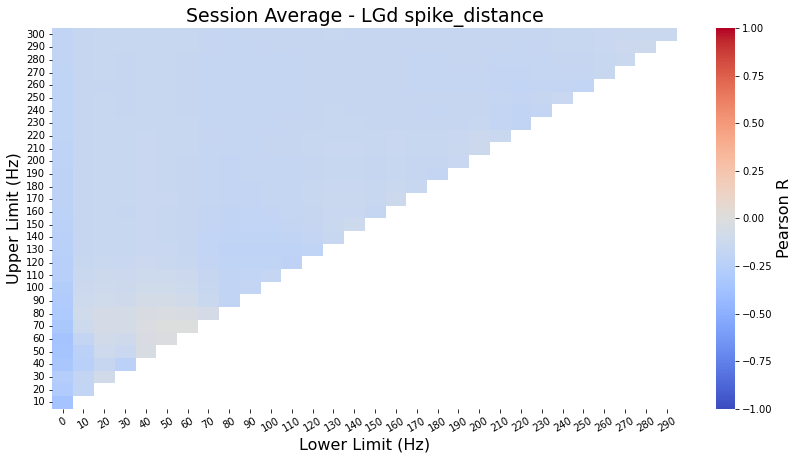

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

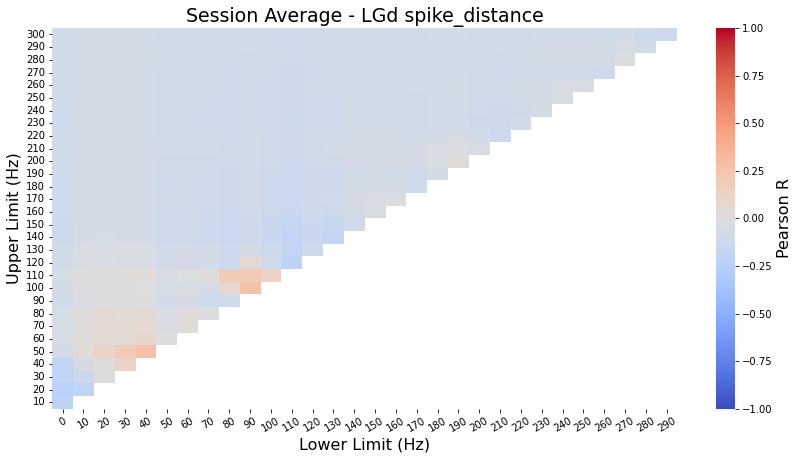

Analyzing File:	847657808_848037572_lfp_psd.npz
Analyzing File:	840012044_868297129_lfp_psd.npz
Analyzing File:	839068429_868929138_lfp_psd.npz
Analyzing File:	835479236_837761710_lfp_psd.npz
Analyzing File:	831882777_832810578_lfp_psd.npz
Analyzing File:	829720705_832129154_lfp_psd.npz
Analyzing File:	821695405_822645897_lfp_psd.npz
Analyzing File:	816200189_836943717_lfp_psd.npz
Analyzing File:	794812542_810758781_lfp_psd.npz
Analyzing File:	789848216_805002031_lfp_psd.npz
Analyzing File:	793224716_805124806_lfp_psd.npz
Analyzing File:	787025148_792586842_lfp_psd.npz
Analyzing File:	786091066_792623921_lfp_psd.npz
Analyzing File:	781842082_792586881_lfp_psd.npz
Analyzing File:	779839471_792645497_lfp_psd.npz
Analyzing File:	778998620_792626847_lfp_psd.npz
Analyzing File:	778240327_792607549_lfp_psd.npz
Analyzing File:	774875821_792602654_lfp_psd.npz
Analyzing File:	771160300_773621942_lfp_psd.npz
Analyzing File:	771990200_773654728_lfp_psd.npz
Analyzing File:	768515987_773549848_lfp_

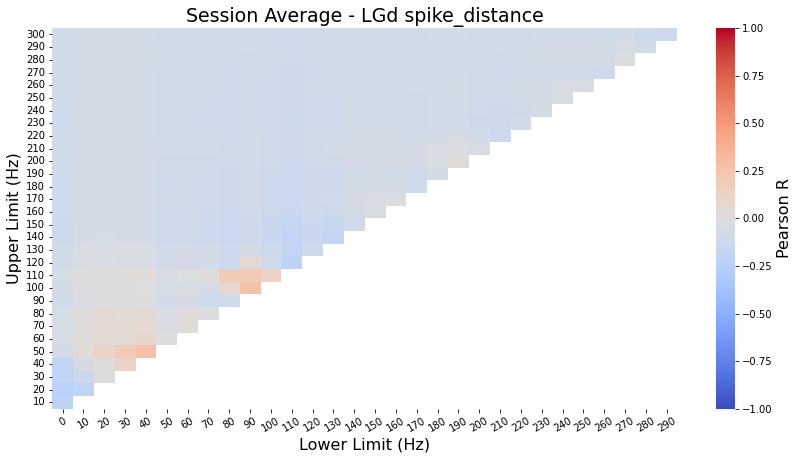

In [73]:
# natural_movie_shuffled
shuffled_psd = f'{PSD_PATH}/natural_movie_shuffled'
shuffled_spikes = f'{SPIKES_IN}/VISp-LGd_natural_movie_shuffled.csv'

dir_base = f"{PROJECT_PATH}/figures/sensitivity_analysis/natural_movie_shuffled"

for region in regions:
    for metric in metrics:
        for running in run_states:
            
            if running:
                dir_figures = f"{dir_base}/running"
            else:
                dir_figures = f"{dir_base}/stationary"
                
            sensitivity_analysis(metric, region, shuffled_psd, shuffled_spikes, running=running,
                                 dir_figures = f"{dir_figures}/non_masked",
                                plot_sessions=True, mask_nonsig=False);
            sensitivity_analysis(metric, region, shuffled_psd, shuffled_spikes, running=running,
                                 dir_figures = f"{dir_figures}/masked",
                                plot_sessions=True, mask_nonsig=True);

In [ ]:
# absolute difference of sessions

In [56]:
# create directory to save figures
for behavior in ['running', 'stationary']:
    dirs = f"{PROJECT_PATH}/figures/sensitivity_analysis/absolute_difference/{behavior}"
    if not os.path.exists(dirs):
        os.makedirs(dirs)

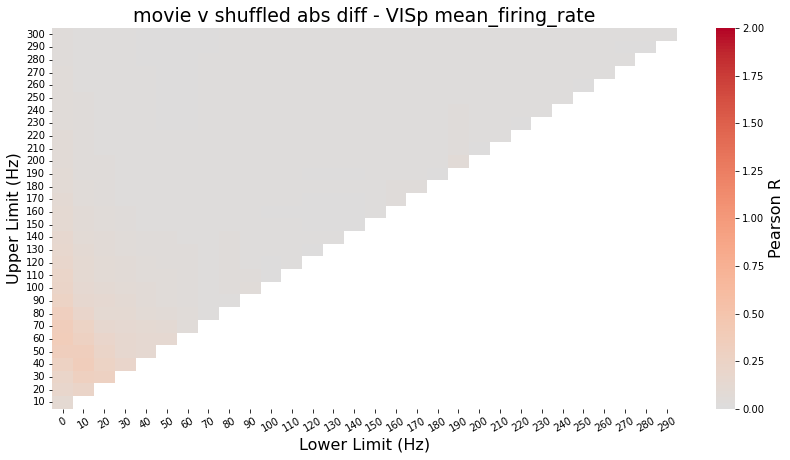

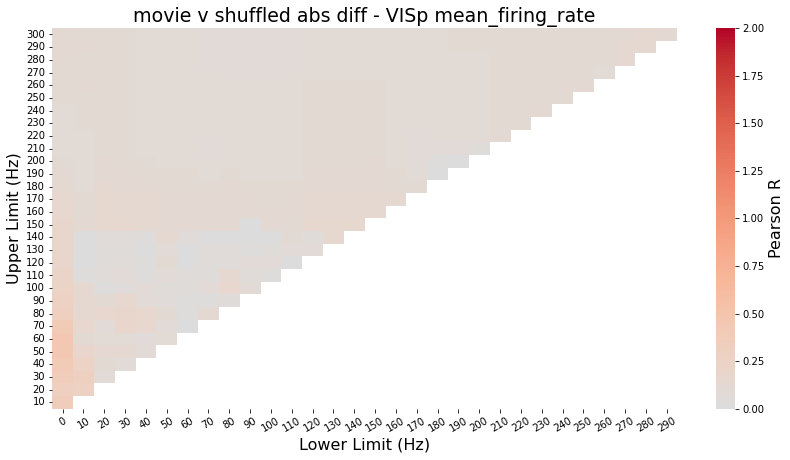

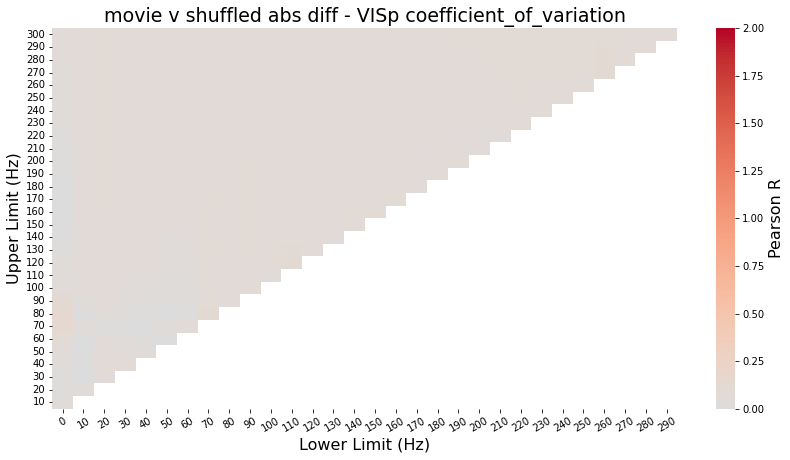

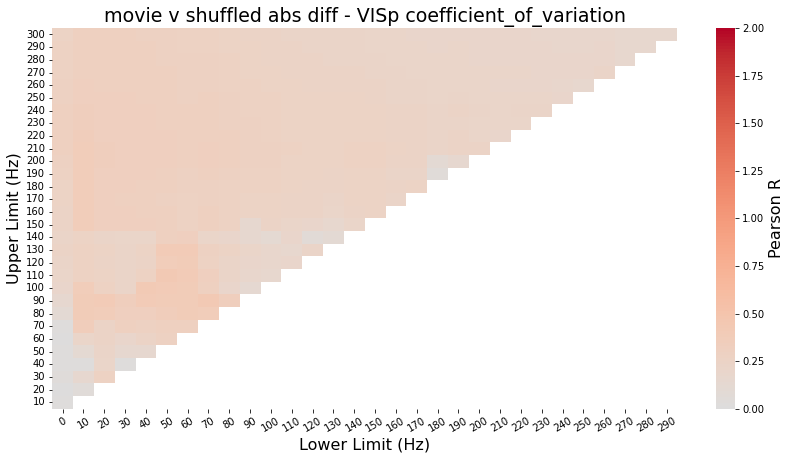

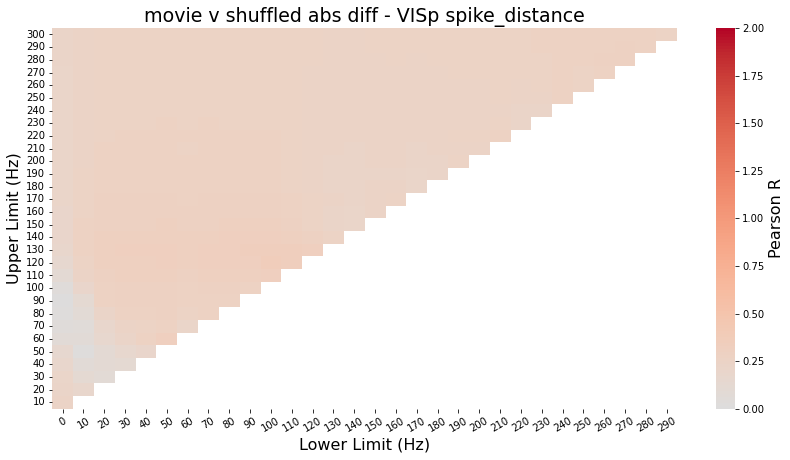

...

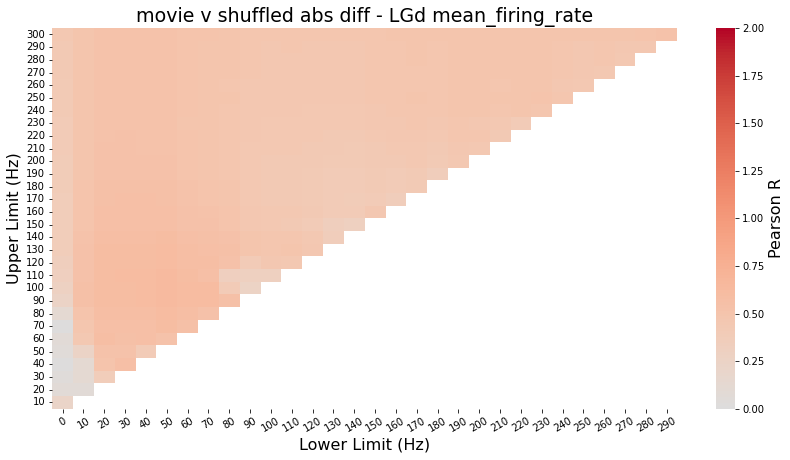

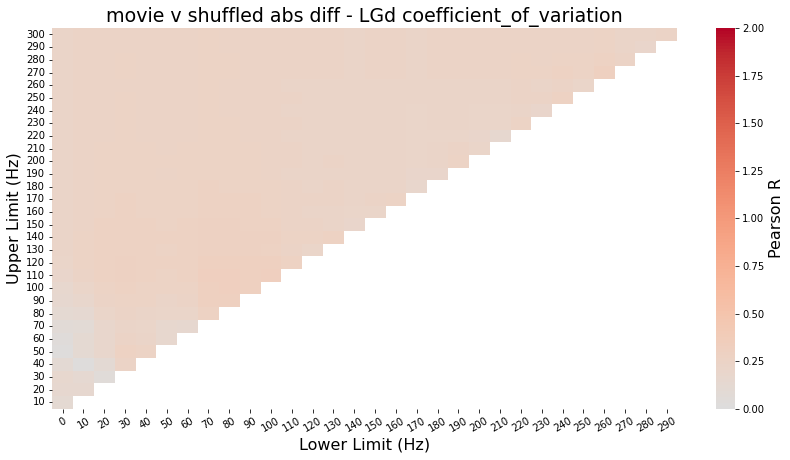

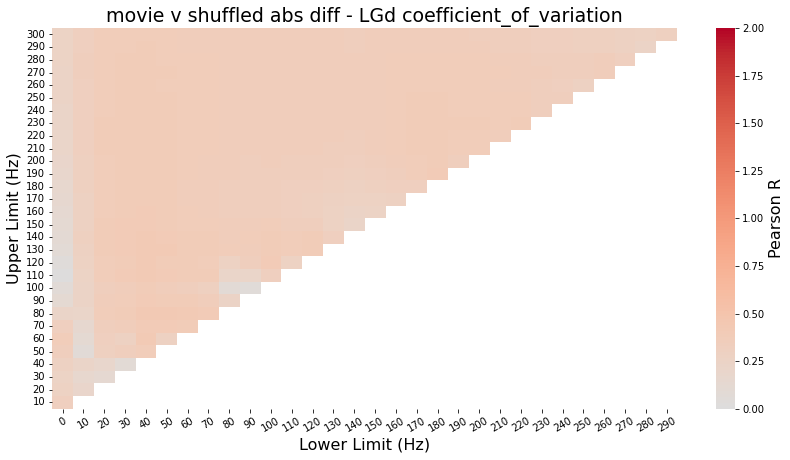

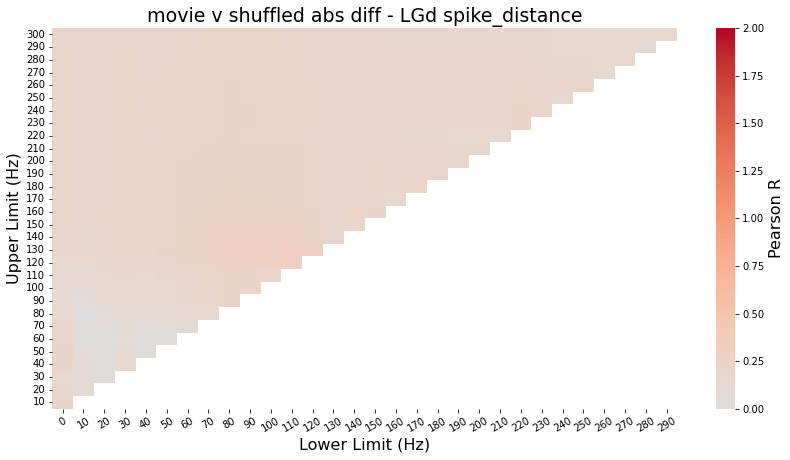

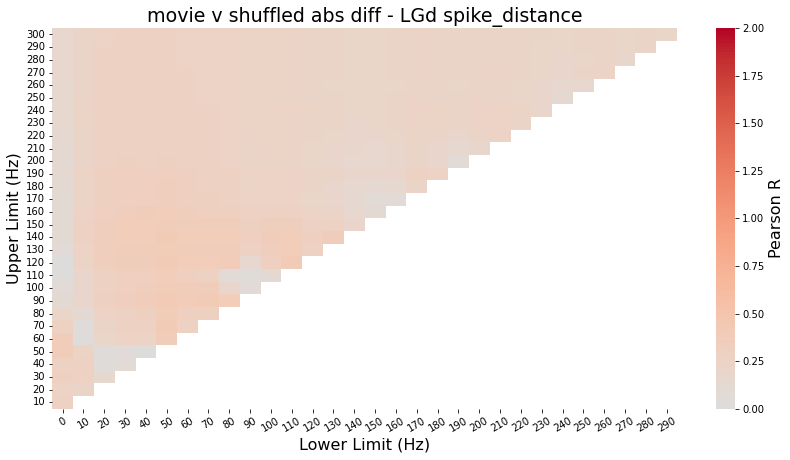

In [64]:
dir_figures = f"{PROJECT_PATH}/figures/sensitivity_analysis/absolute_difference"

for region in regions:
    for metric in metrics:
        for running in run_states:
            movie_avg = np.load(f"{MATRICES_OUT}/natural_movie/{region}_{metric}_running={running}.npy")
            shuffled_avg = np.load(f"{MATRICES_OUT}/natural_movie_shuffled/{region}_{metric}_running={running}.npy")
            
            if running:
                fname_out = f"{dir_figures}/running/{region}_{metric}"
            else:
                fname_out = f"{dir_figures}/stationary/{region}_{metric}"

            # Pearson R diff
            plot_sa_heat_map(np.absolute(np.mean(movie_avg, axis=2)-np.mean(shuffled_avg, axis=2)), xlabels=range(0, 300, 10), \
                             ylabels=range(300, 0, -10), graph_title=f"movie v shuffled abs diff - {region} {metric}", 
                             fname_out=fname_out, show_fig=True, vmin=0, vmax=2);